# Imports

In [1]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score,f1_score, roc_auc_score,confusion_matrix, ConfusionMatrixDisplay

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

import sys
sys.path.append('/kaggle/usr/lib/airline_customer_satisfaction_common/')  
import airline_customer_satisfaction_common
from airline_customer_satisfaction_common import CustomRename, CustomImputer, CustomFeatureCreator, CustomEncoder, CustomScaler


from sklearn.naive_bayes import GaussianNB, CategoricalNB, BernoulliNB

import pylab

import math
import datetime

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

input_file_path='/kaggle/input/airline-csv/'

import warnings
warnings.filterwarnings('ignore')

import logging
logging.basicConfig(filename='airline_satisfaction_bayes.log',
                    filemode='a',
                    format='%(asctime)s,%(msecs)03d %(name)s %(levelname)s %(message)s',
                    datefmt='%Y-%m-%d %H:%M:%S',
                    level=logging.DEBUG)

# Creating an object
logger = logging.getLogger()

# Setting the threshold of logger to DEBUG
logger.setLevel(logging.DEBUG)

In [3]:
#load dataset
df_original = pd.read_csv(input_file_path+"Invistico_Airline.csv")

In [4]:
df_original.info()
df_original.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 22 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   satisfaction                       129880 non-null  object 
 1   Customer Type                      129880 non-null  object 
 2   Age                                129880 non-null  int64  
 3   Type of Travel                     129880 non-null  object 
 4   Class                              129880 non-null  object 
 5   Flight Distance                    129880 non-null  int64  
 6   Seat comfort                       129880 non-null  int64  
 7   Departure/Arrival time convenient  129880 non-null  int64  
 8   Food and drink                     129880 non-null  int64  
 9   Gate location                      129880 non-null  int64  
 10  Inflight wifi service              129880 non-null  int64  
 11  Inflight entertainment             1298

,satisfaction,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0


# Clean data, transform data

* Plan A: drop rows which have missing values
    * According to EDA, we know that 393 rows have missing values, 0.3% of total, we could delete them
* Plan B: drop cols which have missing values
    * According to EDA, we know that departure_delay_in_minutes and arrival_delay_in_minutes are correlated<BR/>
      we could use one of them

Reference:
* [How To Write Clean And Scalable Code With Custom Transformers & Sklearn Pipelines](https://medium.com/@benlc77/how-to-write-clean-and-scalable-code-with-custom-transformers-sklearn-pipelines-ecb8e53fe110)
* [Missing value imputation using Sklearn pipelines](https://marloz.github.io/projects/sklearn/pipeline/missing/preprocessing/2020/03/20/sklearn-pipelines-missing-values.html)
* [SimpleImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html)
* [OneHotEncoder](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html)

In [5]:
############################################################
# Clean data, transform data
# Plan A
############################################################
data_process_pipeline = Pipeline(
    steps=[
        ('rename_features',CustomRename()),
        ("impute_features", CustomImputer(missing_values = np.nan, 
                        strategy ='drop_row')),   
        ('create_new_features',CustomFeatureCreator()),   
    ]
)
data_process_pipeline=data_process_pipeline.fit(df_original)
df_trans_drop_row=data_process_pipeline.transform(df_original)
print(df_trans_drop_row.shape)
df_trans_drop_row.head(10)

(129487, 45)


,satisfaction,customer_type,age,type_of_travel,class,flight_distance,seat_comfort,departure_arrival_time_convenient,food_and_drink,gate_location,inflight_wifi_service,inflight_entertainment,online_support,ease_of_online_booking,on_board_service,leg_room_service,baggage_handling,checkin_service,cleanliness,online_boarding,departure_delay_in_minutes,arrival_delay_in_minutes,departure_delay_in_hours,departure_delay_class,arrival_delay_in_hours,arrival_delay_class,flight_distance_range,flight_distance_class,age_range,age_class_by_airline,seat_comfort_class,departure_arrival_time_convenient_class,food_and_drink_class,gate_location_class,inflight_wifi_service_class,inflight_entertainment_class,online_support_class,ease_of_online_booking_class,on_board_service_class,leg_room_service_class,baggage_handling_class,checkin_service_class,cleanliness_class,online_boarding_class,class_m
0,satisfied,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0,0.0,No Delay,0.0,No Delay,<1K,Short-Haul,"[60,70)",Senior,Low,Low,Low,Median,Median,High,Median,Median,Median,Low,Median,High,Median,Median,Eco&EcoPlus
1,satisfied,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,305.0,5.0,Significant Delay,5.0,Significant Delay,"[1K,3K)",Medium-Haul,"[40,50)",Adult,Low,Low,Low,Median,Low,Median,Median,Median,High,High,High,Median,Median,Median,Business
2,satisfied,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0,0.0,No Delay,0.0,No Delay,"[1K,3K)",Medium-Haul,"[10,20)",Young-Adult,Low,Low,Low,Median,Median,Low,Median,Median,Median,Median,High,High,High,Median,Eco&EcoPlus
3,satisfied,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0,0.0,No Delay,0.0,No Delay,<1K,Short-Haul,"[60,70)",Adult,Low,Low,Low,Median,Median,High,Median,Low,Low,Low,Low,High,Low,Median,Eco&EcoPlus
4,satisfied,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0,0.0,No Delay,0.0,No Delay,<1K,Short-Haul,>=70,Senior,Low,Low,Low,Median,High,Median,High,Median,Median,Low,Median,High,Median,High,Eco&EcoPlus
5,satisfied,Loyal Customer,30,Personal Travel,Eco,1894,0,0,0,3,2,0,2,2,5,4,5,5,4,2,0,0.0,0.0,No Delay,0.0,No Delay,"[1K,3K)",Medium-Haul,"[30,40)",Adult,Low,Low,Low,Median,Median,Low,Median,Median,High,High,High,High,High,Median,Eco&EcoPlus
6,satisfied,Loyal Customer,66,Personal Travel,Eco,227,0,0,0,3,2,5,5,5,5,0,5,5,5,3,17,15.0,0.0,Minor Delay,0.0,Minor Delay,<1K,Short-Haul,"[60,70)",Senior,Low,Low,Low,Median,Median,High,High,High,High,Low,High,High,High,Median,Eco&EcoPlus
7,satisfied,Loyal Customer,10,Personal Travel,Eco,1812,0,0,0,3,2,0,2,2,3,3,4,5,4,2,0,0.0,0.0,No Delay,0.0,No Delay,"[1K,3K)",Medium-Haul,"[10,20)",Children,Low,Low,Low,Median,Median,Low,Median,Median,Median,Median,High,High,High,Median,Eco&EcoPlus
8,satisfied,Loyal Customer,56,Personal Travel,Business,73,0,0,0,3,5,3,5,4,4,0,1,5,4,4,0,0.0,0.0,No Delay,0.0,No Delay,<1K,Short-Haul,"[50,60)",Adult,Low,Low,Low,Median,High,Median,High,High,High,Low,Low,High,High,High,Business
9,satisfied,Loyal Customer,22,Personal Travel,Eco,1556,0,0,0,3,2,0,2,2,2,4,5,3,4,2,30,26.0,0.0,Minor Delay,0.0,Minor Delay,"[1K,3K)",Medium-Haul,"[20,30)",Adult,Low,Low,Low,Median,Median,Low,Median,Median,Median,High,High,Median,High,Median,Eco&EcoPlus


In [6]:
############################################################
# Clean data, transform data
# Plan B
############################################################
data_process_pipeline = Pipeline(
    steps=[
        ('rename_features',CustomRename()),
        ("impute_features", CustomImputer(missing_values = np.nan, 
                        strategy ='drop_col')),   
        ('create_new_features',CustomFeatureCreator()),   
    ]
)
data_process_pipeline=data_process_pipeline.fit(df_original)
df_trans_drop_col=data_process_pipeline.transform(df_original)
print(df_trans_drop_col.shape)
df_trans_drop_col.head(10)

(129880, 42)


,satisfaction,customer_type,age,type_of_travel,class,flight_distance,seat_comfort,departure_arrival_time_convenient,food_and_drink,gate_location,inflight_wifi_service,inflight_entertainment,online_support,ease_of_online_booking,on_board_service,leg_room_service,baggage_handling,checkin_service,cleanliness,online_boarding,departure_delay_in_minutes,departure_delay_in_hours,departure_delay_class,flight_distance_range,flight_distance_class,age_range,age_class_by_airline,seat_comfort_class,departure_arrival_time_convenient_class,food_and_drink_class,gate_location_class,inflight_wifi_service_class,inflight_entertainment_class,online_support_class,ease_of_online_booking_class,on_board_service_class,leg_room_service_class,baggage_handling_class,checkin_service_class,cleanliness_class,online_boarding_class,class_m
0,satisfied,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0,No Delay,<1K,Short-Haul,"[60,70)",Senior,Low,Low,Low,Median,Median,High,Median,Median,Median,Low,Median,High,Median,Median,Eco&EcoPlus
1,satisfied,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,5.0,Significant Delay,"[1K,3K)",Medium-Haul,"[40,50)",Adult,Low,Low,Low,Median,Low,Median,Median,Median,High,High,High,Median,Median,Median,Business
2,satisfied,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0,No Delay,"[1K,3K)",Medium-Haul,"[10,20)",Young-Adult,Low,Low,Low,Median,Median,Low,Median,Median,Median,Median,High,High,High,Median,Eco&EcoPlus
3,satisfied,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0,No Delay,<1K,Short-Haul,"[60,70)",Adult,Low,Low,Low,Median,Median,High,Median,Low,Low,Low,Low,High,Low,Median,Eco&EcoPlus
4,satisfied,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0,No Delay,<1K,Short-Haul,>=70,Senior,Low,Low,Low,Median,High,Median,High,Median,Median,Low,Median,High,Median,High,Eco&EcoPlus
5,satisfied,Loyal Customer,30,Personal Travel,Eco,1894,0,0,0,3,2,0,2,2,5,4,5,5,4,2,0,0.0,No Delay,"[1K,3K)",Medium-Haul,"[30,40)",Adult,Low,Low,Low,Median,Median,Low,Median,Median,High,High,High,High,High,Median,Eco&EcoPlus
6,satisfied,Loyal Customer,66,Personal Travel,Eco,227,0,0,0,3,2,5,5,5,5,0,5,5,5,3,17,0.0,Minor Delay,<1K,Short-Haul,"[60,70)",Senior,Low,Low,Low,Median,Median,High,High,High,High,Low,High,High,High,Median,Eco&EcoPlus
7,satisfied,Loyal Customer,10,Personal Travel,Eco,1812,0,0,0,3,2,0,2,2,3,3,4,5,4,2,0,0.0,No Delay,"[1K,3K)",Medium-Haul,"[10,20)",Children,Low,Low,Low,Median,Median,Low,Median,Median,Median,Median,High,High,High,Median,Eco&EcoPlus
8,satisfied,Loyal Customer,56,Personal Travel,Business,73,0,0,0,3,5,3,5,4,4,0,1,5,4,4,0,0.0,No Delay,<1K,Short-Haul,"[50,60)",Adult,Low,Low,Low,Median,High,Median,High,High,High,Low,Low,High,High,High,Business
9,satisfied,Loyal Customer,22,Personal Travel,Eco,1556,0,0,0,3,2,0,2,2,2,4,5,3,4,2,30,0.0,Minor Delay,"[1K,3K)",Medium-Haul,"[20,30)",Adult,Low,Low,Low,Median,Median,Low,Median,Median,Median,High,High,Median,High,Median,Eco&EcoPlus


### Encode data

* Plan A:
    * Dummy encoding `customer_type` and `type_of_travel`
    * Ordinal encoding `class`,`class_m`,`age_range`,`age_class_by_airline`,`flight_distance_range`,`flight_distance_class`,
`departure_delay_class`,`satisfaction`,
`seat_comfort_class`, `departure_arrival_time_convenient_class`, `food_and_drink_class`,
`gate_location_class`, `inflight_wifi_service_class`,
`inflight_entertainment_class`, `online_support_class`,
`ease_of_online_booking_class`, `on_board_service_class`,
`leg_room_service_class`, `baggage_handling_class`,
`checkin_service_class`, `cleanliness_class`, `online_boarding_class`
* Plan B: drop cols which have missing values
    * Dummy encoding `class`,`class_m`,`age_range`,`age_class_by_airline`,`flight_distance_range`,`flight_distance_class`,`departure_delay_class`, `customer_type`,`type_of_travel`,
`seat_comfort_class`, `departure_arrival_time_convenient_class`, `food_and_drink_class`,
`gate_location_class`, `inflight_wifi_service_class`,
`inflight_entertainment_class`, `online_support_class`,
`ease_of_online_booking_class`, `on_board_service_class`,
`leg_room_service_class`, `baggage_handling_class`,
`checkin_service_class`, `cleanliness_class`, `online_boarding_class`,
`seat_comfort`, `departure_arrival_time_convenient`,
`food_and_drink`, `gate_location`, `inflight_wifi_service`,
`inflight_entertainment`, `online_support`, `ease_of_online_booking`,
`on_board_service`, `leg_room_service`, `baggage_handling`,
`checkin_service`, `cleanliness`, `online_boarding`
    * Ordinal encoding `satisfaction`

In [7]:
############################################################
# Encode data
# Plan A: df_trans_drop_row
# Encode data: Plan A
############################################################
ordinal_list=['class','class_m','age_range','age_class_by_airline','flight_distance_range','flight_distance_class',
              'departure_delay_class','satisfaction',
               'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
               'gate_location_class', 'inflight_wifi_service_class',
               'inflight_entertainment_class', 'online_support_class',
               'ease_of_online_booking_class', 'on_board_service_class',
               'leg_room_service_class', 'baggage_handling_class',
               'checkin_service_class', 'cleanliness_class', 'online_boarding_class']
onehot_list=['customer_type','type_of_travel']

data_encode_pipeline = Pipeline(
    steps=[
        ('encode_features',CustomEncoder(ordinal_col_list=ordinal_list,dummy_col_list=onehot_list)), 
    ]
)

data_encode_pipeline=data_encode_pipeline.fit(df_trans_drop_row)
df_encode_aa=data_encode_pipeline.transform(df_trans_drop_row)
print(df_encode_aa.shape)
df_encode_aa.head(10)

(129487, 45)


,satisfaction,age,class,flight_distance,seat_comfort,departure_arrival_time_convenient,food_and_drink,gate_location,inflight_wifi_service,inflight_entertainment,online_support,ease_of_online_booking,on_board_service,leg_room_service,baggage_handling,checkin_service,cleanliness,online_boarding,departure_delay_in_minutes,arrival_delay_in_minutes,departure_delay_in_hours,departure_delay_class,arrival_delay_in_hours,arrival_delay_class,flight_distance_range,flight_distance_class,age_range,age_class_by_airline,seat_comfort_class,departure_arrival_time_convenient_class,food_and_drink_class,gate_location_class,inflight_wifi_service_class,inflight_entertainment_class,online_support_class,ease_of_online_booking_class,on_board_service_class,leg_room_service_class,baggage_handling_class,checkin_service_class,cleanliness_class,online_boarding_class,class_m,customer_type_dummy_disloyal_customer,type_of_travel_dummy_personal_travel
0,1,65,0,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0,0.0,0,0.0,No Delay,0,0,6,4,0,0,0,1,1,2,1,1,1,0,1,2,1,1,0,0,1
1,1,47,2,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,305.0,5.0,3,5.0,Significant Delay,1,1,4,3,0,0,0,1,0,1,1,1,2,2,2,1,1,1,1,0,1
2,1,15,0,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0,0.0,0,0.0,No Delay,1,1,1,2,0,0,0,1,1,0,1,1,1,1,2,2,2,1,0,0,1
3,1,60,0,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0,0.0,0,0.0,No Delay,0,0,6,3,0,0,0,1,1,2,1,0,0,0,0,2,0,1,0,0,1
4,1,70,0,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0,0.0,0,0.0,No Delay,0,0,7,4,0,0,0,1,2,1,2,1,1,0,1,2,1,2,0,0,1
5,1,30,0,1894,0,0,0,3,2,0,2,2,5,4,5,5,4,2,0,0.0,0.0,0,0.0,No Delay,1,1,3,3,0,0,0,1,1,0,1,1,2,2,2,2,2,1,0,0,1
6,1,66,0,227,0,0,0,3,2,5,5,5,5,0,5,5,5,3,17,15.0,0.0,1,0.0,Minor Delay,0,0,6,4,0,0,0,1,1,2,2,2,2,0,2,2,2,1,0,0,1
7,1,10,0,1812,0,0,0,3,2,0,2,2,3,3,4,5,4,2,0,0.0,0.0,0,0.0,No Delay,1,1,1,1,0,0,0,1,1,0,1,1,1,1,2,2,2,1,0,0,1
8,1,56,2,73,0,0,0,3,5,3,5,4,4,0,1,5,4,4,0,0.0,0.0,0,0.0,No Delay,0,0,5,3,0,0,0,1,2,1,2,2,2,0,0,2,2,2,1,0,1
9,1,22,0,1556,0,0,0,3,2,0,2,2,2,4,5,3,4,2,30,26.0,0.0,1,0.0,Minor Delay,1,1,2,3,0,0,0,1,1,0,1,1,1,2,2,1,2,1,0,0,1


In [8]:
############################################################
# Encode data
# Plan A: df_trans_drop_row
# Encode data: Plan B
############################################################

ordinal_list=['satisfaction']

onehot_list=['class','class_m','age_range','age_class_by_airline','flight_distance_range','flight_distance_class','departure_delay_class', 'customer_type','type_of_travel',
               'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
               'gate_location_class', 'inflight_wifi_service_class',
               'inflight_entertainment_class', 'online_support_class',
               'ease_of_online_booking_class', 'on_board_service_class',
               'leg_room_service_class', 'baggage_handling_class',
               'checkin_service_class', 'cleanliness_class', 'online_boarding_class',
               'seat_comfort', 'departure_arrival_time_convenient',
               'food_and_drink', 'gate_location', 'inflight_wifi_service',
               'inflight_entertainment', 'online_support', 'ease_of_online_booking',
               'on_board_service', 'leg_room_service', 'baggage_handling',
               'checkin_service', 'cleanliness', 'online_boarding']

data_encode_pipeline = Pipeline(
    steps=[
        ('encode_features',CustomEncoder(ordinal_col_list=ordinal_list,dummy_col_list=onehot_list)), 
    ]
)
data_encode_pipeline=data_encode_pipeline.fit(df_trans_drop_row)
df_encode_ab=data_encode_pipeline.transform(df_trans_drop_row)
print(df_encode_ab.shape)
df_encode_ab.head(10)

(129487, 128)


,satisfaction,age,flight_distance,departure_delay_in_minutes,arrival_delay_in_minutes,departure_delay_in_hours,arrival_delay_in_hours,arrival_delay_class,customer_type_dummy_disloyal_customer,type_of_travel_dummy_personal_travel,class_dummy_eco,class_dummy_eco_plus,seat_comfort_dummy_1,seat_comfort_dummy_2,seat_comfort_dummy_3,seat_comfort_dummy_4,seat_comfort_dummy_5,departure_arrival_time_convenient_dummy_1,departure_arrival_time_convenient_dummy_2,departure_arrival_time_convenient_dummy_3,departure_arrival_time_convenient_dummy_4,departure_arrival_time_convenient_dummy_5,food_and_drink_dummy_1,food_and_drink_dummy_2,food_and_drink_dummy_3,food_and_drink_dummy_4,food_and_drink_dummy_5,gate_location_dummy_1,gate_location_dummy_2,gate_location_dummy_3,gate_location_dummy_4,gate_location_dummy_5,inflight_wifi_service_dummy_1,inflight_wifi_service_dummy_2,inflight_wifi_service_dummy_3,inflight_wifi_service_dummy_4,inflight_wifi_service_dummy_5,inflight_entertainment_dummy_1,inflight_entertainment_dummy_2,inflight_entertainment_dummy_3,inflight_entertainment_dummy_4,inflight_entertainment_dummy_5,online_support_dummy_1,online_support_dummy_2,online_support_dummy_3,online_support_dummy_4,online_support_dummy_5,ease_of_online_booking_dummy_1,ease_of_online_booking_dummy_2,ease_of_online_booking_dummy_3,ease_of_online_booking_dummy_4,ease_of_online_booking_dummy_5,on_board_service_dummy_1,on_board_service_dummy_2,on_board_service_dummy_3,on_board_service_dummy_4,on_board_service_dummy_5,leg_room_service_dummy_1,leg_room_service_dummy_2,leg_room_service_dummy_3,leg_room_service_dummy_4,leg_room_service_dummy_5,baggage_handling_dummy_2,baggage_handling_dummy_3,baggage_handling_dummy_4,baggage_handling_dummy_5,checkin_service_dummy_1,checkin_service_dummy_2,checkin_service_dummy_3,checkin_service_dummy_4,checkin_service_dummy_5,cleanliness_dummy_1,cleanliness_dummy_2,cleanliness_dummy_3,cleanliness_dummy_4,cleanliness_dummy_5,online_boarding_dummy_1,online_boarding_dummy_2,online_boarding_dummy_3,online_boarding_dummy_4,online_boarding_dummy_5,departure_delay_class_dummy_moderate_delay,departure_delay_class_dummy_no_delay,departure_delay_class_dummy_significant_delay,flight_distance_range_dummy_gte4k,flight_distance_range_dummy_1k_3k,flight_distance_range_dummy_3k_4k,flight_distance_class_dummy_medium_haul,flight_distance_class_dummy_short_haul,age_range_dummy_gte70,age_range_dummy_10_20,age_range_dummy_20_30,age_range_dummy_30_40,age_range_dummy_40_50,age_range_dummy_50_60,age_range_dummy_60_70,age_class_by_airline_dummy_children,age_class_by_airline_dummy_senior,age_class_by_airline_dummy_young_adult,seat_comfort_class_dummy_low,seat_comfort_class_dummy_median,departure_arrival_time_convenient_class_dummy_low,departure_arrival_time_convenient_class_dummy_median,food_and_drink_class_dummy_low,food_and_drink_class_dummy_median,gate_location_class_dummy_low,gate_location_class_dummy_median,inflight_wifi_service_class_dummy_low,inflight_wifi_service_class_dummy_median,inflight_entertainment_class_dummy_low,inflight_entertainment_class_dummy_median,online_support_class_dummy_low,online_support_class_dummy_median,ease_of_online_booking_class_dummy_low,ease_of_online_booking_class_dummy_median,on_board_service_class_dummy_low,on_board_service_class_dummy_median,leg_room_service_class_dummy_low,leg_room_service_class_dummy_median,baggage_handling_class_dummy_low,baggage_handling_class_dummy_median,checkin_service_class_dummy_low,checkin_service_class_dummy_median,cleanliness_class_dummy_low,cleanliness_class_dummy_median,online_boarding_class_dummy_low,online_boarding_class_dummy_median,class_m_dummy_eco_ecoplus
0,1,65,265,0,0.0,0.0,0.0,No Delay,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,1,0,1,1
1,1,47,2464,310,305.0,5.0,5.0,Significant Delay,0,1,0,0,0,0,0

In [9]:
############################################################
# Encode data
# Plan B: df_trans_drop_col
# Encode data: Plan A
############################################################
ordinal_list=['class','class_m','age_range','age_class_by_airline','flight_distance_range','flight_distance_class',
              'departure_delay_class','satisfaction',
               'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
               'gate_location_class', 'inflight_wifi_service_class',
               'inflight_entertainment_class', 'online_support_class',
               'ease_of_online_booking_class', 'on_board_service_class',
               'leg_room_service_class', 'baggage_handling_class',
               'checkin_service_class', 'cleanliness_class', 'online_boarding_class']
onehot_list=['customer_type','type_of_travel']

data_encode_pipeline = Pipeline(
    steps=[
        ('encode_features',CustomEncoder(ordinal_col_list=ordinal_list,dummy_col_list=onehot_list)), 
    ]
)
data_encode_pipeline=data_encode_pipeline.fit(df_trans_drop_col)
df_encode_ba=data_encode_pipeline.transform(df_trans_drop_col)
print(df_encode_ba.shape)
df_encode_ba.head(10)

(129880, 42)


,satisfaction,age,class,flight_distance,seat_comfort,departure_arrival_time_convenient,food_and_drink,gate_location,inflight_wifi_service,inflight_entertainment,online_support,ease_of_online_booking,on_board_service,leg_room_service,baggage_handling,checkin_service,cleanliness,online_boarding,departure_delay_in_minutes,departure_delay_in_hours,departure_delay_class,flight_distance_range,flight_distance_class,age_range,age_class_by_airline,seat_comfort_class,departure_arrival_time_convenient_class,food_and_drink_class,gate_location_class,inflight_wifi_service_class,inflight_entertainment_class,online_support_class,ease_of_online_booking_class,on_board_service_class,leg_room_service_class,baggage_handling_class,checkin_service_class,cleanliness_class,online_boarding_class,class_m,customer_type_dummy_disloyal_customer,type_of_travel_dummy_personal_travel
0,1,65,0,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0,0,0,0,6,4,0,0,0,1,1,2,1,1,1,0,1,2,1,1,0,0,1
1,1,47,2,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,5.0,3,1,1,4,3,0,0,0,1,0,1,1,1,2,2,2,1,1,1,1,0,1
2,1,15,0,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0,0,1,1,1,2,0,0,0,1,1,0,1,1,1,1,2,2,2,1,0,0,1
3,1,60,0,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0,0,0,0,6,3,0,0,0,1,1,2,1,0,0,0,0,2,0,1,0,0,1
4,1,70,0,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0,0,0,0,7,4,0,0,0,1,2,1,2,1,1,0,1,2,1,2,0,0,1
5,1,30,0,1894,0,0,0,3,2,0,2,2,5,4,5,5,4,2,0,0.0,0,1,1,3,3,0,0,0,1,1,0,1,1,2,2,2,2,2,1,0,0,1
6,1,66,0,227,0,0,0,3,2,5,5,5,5,0,5,5,5,3,17,0.0,1,0,0,6,4,0,0,0,1,1,2,2,2,2,0,2,2,2,1,0,0,1
7,1,10,0,1812,0,0,0,3,2,0,2,2,3,3,4,5,4,2,0,0.0,0,1,1,1,1,0,0,0,1,1,0,1,1,1,1,2,2,2,1,0,0,1
8,1,56,2,73,0,0,0,3,5,3,5,4,4,0,1,5,4,4,0,0.0,0,0,0,5,3,0,0,0,1,2,1,2,2,2,0,0,2,2,2,1,0,1
9,1,22,0,1556,0,0,0,3,2,0,2,2,2,4,5,3,4,2,30,0.0,1,1,1,2,3,0,0,0,1,1,0,1,1,1,2,2,1,2,1,0,0,1


In [10]:
############################################################
# Encode data
# Plan B: df_trans_drop_col
# Encode data: Plan B
############################################################
ordinal_list=['satisfaction']

onehot_list=['class','class_m','age_range','age_class_by_airline','flight_distance_range','flight_distance_class','departure_delay_class', 'customer_type','type_of_travel',
               'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
               'gate_location_class', 'inflight_wifi_service_class',
               'inflight_entertainment_class', 'online_support_class',
               'ease_of_online_booking_class', 'on_board_service_class',
               'leg_room_service_class', 'baggage_handling_class',
               'checkin_service_class', 'cleanliness_class', 'online_boarding_class',
               'seat_comfort', 'departure_arrival_time_convenient',
               'food_and_drink', 'gate_location', 'inflight_wifi_service',
               'inflight_entertainment', 'online_support', 'ease_of_online_booking',
               'on_board_service', 'leg_room_service', 'baggage_handling',
               'checkin_service', 'cleanliness', 'online_boarding']

data_encode_pipeline = Pipeline(
    steps=[
        ('encode_features',CustomEncoder(ordinal_col_list=ordinal_list,dummy_col_list=onehot_list)), 
    ]
)

data_encode_pipeline=data_encode_pipeline.fit(df_trans_drop_col)
df_encode_bb=data_encode_pipeline.transform(df_trans_drop_col)
print(df_encode_bb.shape)
df_encode_bb.head(10)

(129880, 125)


,satisfaction,age,flight_distance,departure_delay_in_minutes,departure_delay_in_hours,customer_type_dummy_disloyal_customer,type_of_travel_dummy_personal_travel,class_dummy_eco,class_dummy_eco_plus,seat_comfort_dummy_1,seat_comfort_dummy_2,seat_comfort_dummy_3,seat_comfort_dummy_4,seat_comfort_dummy_5,departure_arrival_time_convenient_dummy_1,departure_arrival_time_convenient_dummy_2,departure_arrival_time_convenient_dummy_3,departure_arrival_time_convenient_dummy_4,departure_arrival_time_convenient_dummy_5,food_and_drink_dummy_1,food_and_drink_dummy_2,food_and_drink_dummy_3,food_and_drink_dummy_4,food_and_drink_dummy_5,gate_location_dummy_1,gate_location_dummy_2,gate_location_dummy_3,gate_location_dummy_4,gate_location_dummy_5,inflight_wifi_service_dummy_1,inflight_wifi_service_dummy_2,inflight_wifi_service_dummy_3,inflight_wifi_service_dummy_4,inflight_wifi_service_dummy_5,inflight_entertainment_dummy_1,inflight_entertainment_dummy_2,inflight_entertainment_dummy_3,inflight_entertainment_dummy_4,inflight_entertainment_dummy_5,online_support_dummy_1,online_support_dummy_2,online_support_dummy_3,online_support_dummy_4,online_support_dummy_5,ease_of_online_booking_dummy_1,ease_of_online_booking_dummy_2,ease_of_online_booking_dummy_3,ease_of_online_booking_dummy_4,ease_of_online_booking_dummy_5,on_board_service_dummy_1,on_board_service_dummy_2,on_board_service_dummy_3,on_board_service_dummy_4,on_board_service_dummy_5,leg_room_service_dummy_1,leg_room_service_dummy_2,leg_room_service_dummy_3,leg_room_service_dummy_4,leg_room_service_dummy_5,baggage_handling_dummy_2,baggage_handling_dummy_3,baggage_handling_dummy_4,baggage_handling_dummy_5,checkin_service_dummy_1,checkin_service_dummy_2,checkin_service_dummy_3,checkin_service_dummy_4,checkin_service_dummy_5,cleanliness_dummy_1,cleanliness_dummy_2,cleanliness_dummy_3,cleanliness_dummy_4,cleanliness_dummy_5,online_boarding_dummy_1,online_boarding_dummy_2,online_boarding_dummy_3,online_boarding_dummy_4,online_boarding_dummy_5,departure_delay_class_dummy_moderate_delay,departure_delay_class_dummy_no_delay,departure_delay_class_dummy_significant_delay,flight_distance_range_dummy_gte4k,flight_distance_range_dummy_1k_3k,flight_distance_range_dummy_3k_4k,flight_distance_class_dummy_medium_haul,flight_distance_class_dummy_short_haul,age_range_dummy_gte70,age_range_dummy_10_20,age_range_dummy_20_30,age_range_dummy_30_40,age_range_dummy_40_50,age_range_dummy_50_60,age_range_dummy_60_70,age_class_by_airline_dummy_children,age_class_by_airline_dummy_senior,age_class_by_airline_dummy_young_adult,seat_comfort_class_dummy_low,seat_comfort_class_dummy_median,departure_arrival_time_convenient_class_dummy_low,departure_arrival_time_convenient_class_dummy_median,food_and_drink_class_dummy_low,food_and_drink_class_dummy_median,gate_location_class_dummy_low,gate_location_class_dummy_median,inflight_wifi_service_class_dummy_low,inflight_wifi_service_class_dummy_median,inflight_entertainment_class_dummy_low,inflight_entertainment_class_dummy_median,online_support_class_dummy_low,online_support_class_dummy_median,ease_of_online_booking_class_dummy_low,ease_of_online_booking_class_dummy_median,on_board_service_class_dummy_low,on_board_service_class_dummy_median,leg_room_service_class_dummy_low,leg_room_service_class_dummy_median,baggage_handling_class_dummy_low,baggage_handling_class_dummy_median,checkin_service_class_dummy_low,checkin_service_class_dummy_median,cleanliness_class_dummy_low,cleanliness_class_dummy_median,online_boarding_class_dummy_low,online_boarding_class_dummy_median,class_m_dummy_eco_ecoplus
0,1,65,265,0,0.0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,1,0,1,0,0,1,0,1,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,1,0,1,1
1,1,47,2464,310,5.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,

# Build Model

## Split data

|No|Clean and Transformation |Encode |Split Data  |X_list|
|:-|:-                       |:-     |:-          |:-    |
|1 |Plan A(df_trans_drop_row)|Plan A(most ordinal encoding) |df_encode_aa|X_list[0]|
|2 |Plan A(df_trans_drop_row)|Plan B(most onehot encoding) |df_encode_ab|X_list[1]|
|3 |Plan B(df_trans_drop_col)|Plan A(most ordinal encoding) |df_encode_ba|X_list[2]|
|4 |Plan B(df_trans_drop_col)|Plan B(most onehot encoding) |df_encode_bb|X_list[3]|

In [11]:
############################################################
# Split data
############################################################
RANDOM_STATE=0
depedent_variables=["satisfaction"]

df_encode_list=[df_encode_aa, df_encode_ab, df_encode_ba, df_encode_bb]
X_list=[]
y_list=[]


for df_encode in df_encode_list:
    X, y = df_encode.drop(columns=["satisfaction"]), df_encode["satisfaction"]
    X_list.append(X)
    y_list.append(y)


X_train_val_list=[]
y_train_val_list=[]
X_test_list=[]
y_test_list=[]
X_train_list=[]
y_train_list=[]
X_val_list=[]
y_val_list=[]

for X,y in zip(X_list,y_list):
    X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, 
                                                        test_size=0.25, stratify=y, 
                                                        random_state=RANDOM_STATE)
    
    # Split train into train and validation sets
    X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, 
                                                      test_size=0.2, stratify=y_train_val, 
                                                      random_state=RANDOM_STATE)

    print(X_train_val.shape,y_train_val.shape,X_train.shape,y_train.shape,X_val.shape,y_val.shape,X_test.shape,y_test.shape)
    X_train_val_list.append(X_train_val)
    y_train_val_list.append(y_train_val)
    X_test_list.append(X_test)
    y_test_list.append(y_test)
    X_train_list.append(X_train)
    y_train_list.append(y_train)
    X_val_list.append(X_val)
    y_val_list.append(y_val)


(97115, 44) (97115,) (77692, 44) (77692,) (19423, 44) (19423,) (32372, 44) (32372,)
(97115, 127) (97115,) (77692, 127) (77692,) (19423, 127) (19423,) (32372, 127) (32372,)
(97410, 41) (97410,) (77928, 41) (77928,) (19482, 41) (19482,) (32470, 41) (32470,)
(97410, 124) (97410,) (77928, 124) (77928,) (19482, 124) (19482,) (32470, 124) (32470,)


| No. | Feature                                    | Use or not | Description |
|-----|--------------------------------------------|------------|-------------|
| 0   | satisfaction                               | Use        | Depedent variable |
| 1   | customer_type                              | $\text{Use}^{*1}$||
| 2   | age                                        | $\text{Use}^{*2}$| No linearty relation between independent variable and satisfaction |
| 3   | type_of_travel                             | $\text{Use}^{*1}$ |             |
| 4   | class                                      | $\text{Use}^{*3}$ |             |
| 5   | flight_distance                            | $\text{Use}^{*2}$| No linearty relation between independent variable and satisfaction |
| 6   | seat_comfort                               | $\text{Use}^{*1}$| No linearty relation between independent variable and satisfaction |
| 7   | departure_arrival_time_convenient          | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction(almost no change) |
| 8   | food_and_drink                             | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 9   | gate_location                              | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 10  | inflight_wifi_service                      | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 11  | inflight_entertainment                     | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 12  | online_support                             | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 13  | ease_of_online_booking                     | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 14  | on_board_service                           | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 15  | leg_room_service                           | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 16  | baggage_handling                           | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 17  | checkin_service                            | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 18  | cleanliness                                | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 19  | online_boarding                            | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 20  | departure_delay_in_minutes                 | $\text{Use}^{*2}$ | No linearty relation between independent variable and satisfaction |
| 21  | arrival_delay_in_minutes                   | $\text{Use}^{*5}$ | No linearty relation between independent variable and satisfaction |
| 22  | departure_delay_in_hours                   | $\text{Use}^{*5}$ | No linearty relation between independent variable and satisfaction |
| 23  | departure_delay_class                      | $\text{Use}^{*4}$ | Linearty relation between independent variable and satisfaction |
| 24  | arrival_delay_in_hours                     | $\text{Use}^{*2}$  | No linearty relation between independent variable and satisfaction |
| 25  | arrival_delay_class                        | $\text{Use}^{*4}$ | Linearty relation between independent variable and satisfaction |
| 26  | flight_distance_range                      | $\text{Use}^{*5}$ | No linearty relation between independent variable and satisfaction |
| 27  | flight_distance_class                      | $\text{Use}^{*5}$ | No linearty relation between independent variable and satisfaction |
| 28  | age_range                                  | $\text{Use}^{*5}$ | No linearty relation between independent variable and satisfaction |
| 29  | age_class_by_airline                       | $\text{Use}^{*5}$ | No linearty relation between independent variable and satisfaction |
| 30  | seat_comfort_class                         | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 31  | departure_arrival_time_convenient_class    | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 32  | food_and_drink_class                       | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 33  | gate_location_class                        | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 34  | inflight_wifi_service_class                | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 35  | inflight_entertainment_class               | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 36  | online_support_class                       | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 37  | ease_of_online_booking_class               | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 38  | on_board_service_class                     | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 39  | leg_room_service_class                     | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 40  | baggage_handling_class                     | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 41  | checkin_service_class                      | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 42  | cleanliness_class                          | $\text{Use}^{*1}$ | No linearty relation between independent variable and satisfaction |
| 43  | online_boarding_class                      | $\text{Use}^{*1}$ | Linearty relation between independent variable and satisfaction |
| 44  | class_m                                    | $\text{Use}^{*3}$ |             |

* Based on real life experience, airline could get `age`, `class`(passenger reserved), `flight_distance`, `departure_delay_in_minutes`, `arrival_delay_in_minutes`
* $\text{Use}^{*1}$: Use this feature with condition that we could get it in production environment
* $\text{Use}^{*2}$: Use this feature with condition that the model doesn't have linearty assumption(e.g. Not use in logistic regression model).
* $\text{Use}^{*3}$: Use this feature with condition that `class` represents the actual class
    * e.g. if `class` means booking status, not actual flight class, passengers may upgrade to higher class or downgrade to lower class. In this case airline could easily get `class` data, however the result may not be reliable or robust if class upgrade/downgrade occur a lot.
    * e.g. if `class` means actual flight class, airline could not easily get `class` data unless they have other approach to get `class` data
* $\text{Use}^{*4}$: `departure_delay_in_minutes` and `arrival_delay_in_minutes` are correlated, use one of them
* $\text{Use}^{*5}$: Use this feature with condition that the model doesn't have linearty assumption or dummy encoding this variable

|Model Features Used|Feature Index|
|:-|:-|
|customer_type+age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes+arrival_delay_in_minutes|No.1|
|customer_type+age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes|No.2<BR/>No.80-No.89|
|age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes|No.3<BR/>No.70-No.79|
|customer_type+age+class+flight_distance+rating items+departure_delay_in_minutes|No.4<BR/>No.60-No.69|
|customer_type+age+type_of_travel+class+flight_distance+departure_delay_in_minutes|No.5<BR/>No.50-No.59|
|age+class+flight_distance+rating items+departure_delay_in_minutes|No.6<BR/>No.40-No.49|
|age+type_of_travel+class+flight_distance+departure_delay_in_minutes|No.7<BR/>No.30-No.39|
|customer_type+age+class+flight_distance+departure_delay_in_minutes|No.8<BR/>No.20-No.29|
|age+class+flight_distance+departure_delay_in_minutes|No.9<BR/>No.10-No.19|

**Note**
* Model Features Used: Some models will use transformed features
* rating items: Survey rating items, e.g. seat_comfort, departure_arrival_time_convenient, etc

In [12]:
select_col_list=[
    #model 1(for comparison purpose, all use original columns)
    ['customer_type','age', 'type_of_travel','class', 'flight_distance', 'seat_comfort',
       'departure_arrival_time_convenient', 'food_and_drink', 'gate_location',
       'inflight_wifi_service', 'inflight_entertainment', 'online_support',
       'ease_of_online_booking', 'on_board_service', 'leg_room_service',
       'baggage_handling', 'checkin_service', 'cleanliness', 'online_boarding',
       'departure_delay_in_minutes', 'arrival_delay_in_minutes'],
    #model 2(no transformation, model 1 - arrival_delay_in_minutes)
    ['customer_type','age', 'type_of_travel','class', 'flight_distance', 'seat_comfort',
       'departure_arrival_time_convenient', 'food_and_drink', 'gate_location',
       'inflight_wifi_service', 'inflight_entertainment', 'online_support',
       'ease_of_online_booking', 'on_board_service', 'leg_room_service',
       'baggage_handling', 'checkin_service', 'cleanliness', 'online_boarding',
       'departure_delay_in_minutes'],
    #model 3(no transformation, model 2 - customer_type)
    ['age', 'type_of_travel','class', 'flight_distance', 'seat_comfort',
       'departure_arrival_time_convenient', 'food_and_drink', 'gate_location',
       'inflight_wifi_service', 'inflight_entertainment', 'online_support',
       'ease_of_online_booking', 'on_board_service', 'leg_room_service',
       'baggage_handling', 'checkin_service', 'cleanliness', 'online_boarding',
       'departure_delay_in_minutes'],
    #model 4(no transformation, model 2 - type_of_travel)
    ['customer_type','age', 'class', 'flight_distance', 'seat_comfort',
       'departure_arrival_time_convenient', 'food_and_drink', 'gate_location',
       'inflight_wifi_service', 'inflight_entertainment', 'online_support',
       'ease_of_online_booking', 'on_board_service', 'leg_room_service',
       'baggage_handling', 'checkin_service', 'cleanliness', 'online_boarding',
       'departure_delay_in_minutes'],
    #model 5(no transformation, model 2 - rating)
    ['customer_type','age', 'type_of_travel','class', 'flight_distance', 'departure_delay_in_minutes'],
    #model 6(no transformation, model 2 - customer_type - type_of_travel)
    ['age','class', 'flight_distance', 'seat_comfort',
       'departure_arrival_time_convenient', 'food_and_drink', 'gate_location',
       'inflight_wifi_service', 'inflight_entertainment', 'online_support',
       'ease_of_online_booking', 'on_board_service', 'leg_room_service',
       'baggage_handling', 'checkin_service', 'cleanliness', 'online_boarding',
       'departure_delay_in_minutes'],
    #model 7(no transformation, model 2 - customer_type - rating)
    ['age', 'type_of_travel','class', 'flight_distance', 'departure_delay_in_minutes'],
    #model 8(no transformation, model 2 - type_of_travel - rating)
    ['customer_type','age','class', 'flight_distance', 'departure_delay_in_minutes'],
    #model 9(no transformation, model 2 - customer_type - type_of_travel - rating)
    ['age', 'class', 'flight_distance', 'departure_delay_in_minutes'],
    #model 10
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class'],
    #model 11
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class'],
    #model 12
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class'],
    #model 13
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class'],
    #model 14
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class'],
    #model 15
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class'],
    #model 16
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class'],
    #model 17
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class'],
    #model 18
    ['age', 'class', 'flight_distance', 'departure_delay_class'],
    #model 19
    ['age_range', 'class', 'flight_distance', 'departure_delay_class'],
    #model 20(model 10 + customer_type)
    ['customer_type','age_range', 'class', 'flight_distance_range', 'departure_delay_class'],
    #model 21(model 11 + customer_type)
    ['customer_type','age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class'],
    #model 22(model 12 + customer_type)
    ['customer_type','age_range', 'class_m', 'flight_distance_range', 'departure_delay_class'],
    #model 23(model 13 + customer_type)
    ['customer_type','age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class'],
    #model 24(model 14 + customer_type)
    ['customer_type','age_range', 'class', 'flight_distance_class', 'departure_delay_class'],
    #model 25(model 15 + customer_type)
    ['customer_type','age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class'],
    #model 26(model 16 + customer_type)
    ['customer_type','age_range', 'class_m', 'flight_distance_class', 'departure_delay_class'],
    #model 27(model 17 + customer_type)
    ['customer_type','age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class'],
    #model 28(model 18 + customer_type)
    ['customer_type','age', 'class', 'flight_distance', 'departure_delay_class'],
    #model 29(model 19 + customer_type)
    ['customer_type','age_range', 'class', 'flight_distance', 'departure_delay_class'],
    #model 30(model 10 + type_of_travel)
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class','type_of_travel'],
    #model 31(model 11 + type_of_travel)
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class','type_of_travel'],
    #model 32(model 12 + type_of_travel)
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class','type_of_travel'],
    #model 33(model 13 + type_of_travel)
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class','type_of_travel'],
    #model 34(model 14 + type_of_travel)
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class','type_of_travel'],
    #model 35(model 15 + type_of_travel)
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class','type_of_travel'],
    #model 36(model 16 + type_of_travel)
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class','type_of_travel'],
    #model 37(model 17 + type_of_travel)
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class','type_of_travel'],
    #model 38(model 18 + type_of_travel)
    ['age', 'class', 'flight_distance', 'departure_delay_class','type_of_travel'],
    #model 39(model 19 + type_of_travel)
    ['age_range', 'class', 'flight_distance', 'departure_delay_class','type_of_travel'],
    #model 40(model 10 + rating)
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 41(model 11 + rating)
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 42(model 12 + rating)
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 43(model 13 + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 44(model 14 + rating)
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 45(model 15 + rating)
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 46(model 16 + rating)
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 47(model 17 + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 48(model 18 + rating)
    ['age', 'class', 'flight_distance', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 49(model 19 + rating)
    ['age_range', 'class', 'flight_distance', 'departure_delay_class',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 50(model 10 + customer_type + type_of_travel)
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel'],
    #model 51(model 11 + customer_type + type_of_travel)
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel'],
    #model 52(model 12 + customer_type + type_of_travel)
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel'],
    #model 53(model 13 + customer_type + type_of_travel)
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel'],
    #model 54(model 14 + customer_type + type_of_travel)
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel'],
    #model 55(model 15 + customer_type + type_of_travel)
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel'],
    #model 56(model 16 + customer_type + type_of_travel)
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel'],
    #model 57(model 17 + customer_type + type_of_travel)
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel'],
    #model 58(model 18 + customer_type + type_of_travel)
    ['age', 'class', 'flight_distance', 'departure_delay_class','customer_type','type_of_travel'],
    #model 59(model 19 + customer_type + type_of_travel)
    ['age_range', 'class', 'flight_distance', 'departure_delay_class','customer_type','type_of_travel'],
    #model 60(model 10 + customer_type + rating)
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 61(model 11 + customer_type + rating)
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 62(model 12 + customer_type + rating)
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 63(model 13 + customer_type + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 64(model 14 + customer_type + rating)
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 65(model 15 + customer_type + rating)
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 66(model 16 + customer_type + rating)
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 67(model 17 + customer_type + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 68(model 18 + customer_type + rating)
    ['age', 'class', 'flight_distance', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 69(model 19 + customer_type + rating)
    ['age_range', 'class', 'flight_distance', 'departure_delay_class','customer_type',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 70(model 10 + type_of_travel + rating)
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 71(model 11 + type_of_travel + rating)
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 72(model 12 + type_of_travel + rating)
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 73(model 13 + type_of_travel + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 74(model 14 + type_of_travel + rating)
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 75(model 15 + type_of_travel + rating)
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 76(model 16 + type_of_travel + rating)
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 77(model 17 + type_of_travel + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 78(model 18 + type_of_travel + rating)
    ['age', 'class', 'flight_distance', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 79(model 19 + type_of_travel + rating)
    ['age_range', 'class', 'flight_distance', 'departure_delay_class','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 80(model 10 +customer_type + type_of_travel + rating)
    ['age_range', 'class', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 81(model 11 +customer_type + type_of_travel + rating)
    ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 82(model 12 +customer_type + type_of_travel + rating)
    ['age_range', 'class_m', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 83(model 13 +customer_type + type_of_travel + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_range', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 84(model 14 +customer_type + type_of_travel + rating)
    ['age_range', 'class', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 85(model 15 +customer_type + type_of_travel + rating)
    ['age_class_by_airline', 'class', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 86(model 16 +customer_type + type_of_travel + rating)
    ['age_range', 'class_m', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 87(model 17 +customer_type + type_of_travel + rating)
    ['age_class_by_airline', 'class_m', 'flight_distance_class', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 88(model 18 + customer_type + type_of_travel + rating)
    ['age', 'class', 'flight_distance', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
    #model 89(model 19 + customer_type + type_of_travel + rating)
    ['age_range', 'class', 'flight_distance', 'departure_delay_class','customer_type','type_of_travel',
       'seat_comfort_class', 'departure_arrival_time_convenient_class', 'food_and_drink_class',
       'gate_location_class', 'inflight_wifi_service_class',
       'inflight_entertainment_class', 'online_support_class',
       'ease_of_online_booking_class', 'on_board_service_class',
       'leg_room_service_class', 'baggage_handling_class',
       'checkin_service_class', 'cleanliness_class', 'online_boarding_class'],
]

In [13]:

def get_fit_features(select_cols, encoded_cols):
    """
    Get fitting feature list
        select_cols(list): original columns(before encoding)
        encoded_cols(list): encoded columns(after encoding)
    """
    if select_cols is None:
        raise Exception("Please input select_cols")
    if encoded_cols is None:
        raise Exception("Please input encoded_cols")
    select_features=select_cols.copy()
    res_feature_list=[]
    dummy_features=[]

    for sel_col in select_cols:
        exist_flg=False
        for encode_col in encoded_cols:
            if (sel_col in encoded_cols) & (sel_col+'_dummy_' in encode_col):
                raise Exception("Dummy encoding columns duplicated with others, please update column names")
            elif sel_col==encode_col:
                res_feature_list.append(encode_col)
                exist_flg=True
            elif encode_col.startswith(sel_col+'_dummy_'):
                res_feature_list.append(encode_col)
                exist_flg=True
        if exist_flg==False:
            raise Exception(f"{sel_col} doesn't exist")
            

    return res_feature_list


def get_test_scores(model_name:str, preds, y_test_data,preds_prob):
    '''
    Generate a table of test scores.

    In:
    model_name (string): Your choice: how the model will be named in the output table
    preds: numpy array of test predictions
    y_test_data: numpy array of y_test data

    Out:
    table: a pandas df of precision, recall, f1, and accuracy scores for your model
    '''
    accuracy = accuracy_score(y_test_data, preds)
    precision = precision_score(y_test_data, preds)
    recall = recall_score(y_test_data, preds)
    f1 = f1_score(y_test_data, preds)
    

    # Compute the ROC AUC score
    #https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html
    roc_auc = roc_auc_score(y_test_data, preds_prob) 

    table = pd.DataFrame({'model': [model_name],
                        'precision': [precision],
                        'recall': [recall],
                        'F1': [f1],
                        'accuracy': [accuracy],
                        'ROC_AUC': [roc_auc],
                        })

    return table

def confusion_matrix_plot_ax(model, x_data, y_data,ax,title='Confusion matrix'):
    '''
    Accepts as argument model object, X data (test or validate), and y data (test or validate). 
    Returns a plot of confusion matrix for predictions on y data.
    ''' 
  
    model_pred = model.predict(x_data)
    cm = confusion_matrix(y_data, model_pred, labels=model.classes_)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                             display_labels=model.classes_)
  
    disp.plot(values_format='',ax=ax)  # `values_format=''` suppresses scientific notation
    ax.set_title(title)

In [14]:
import pickle 

# Define a path to the folder where you want to save the model
path = '/kaggle/working/'
path_tmp='/kaggle/temp/'

path_nb = path+'nb_pickle/'
path_nb_tmp=path_tmp+'nb_pickle/'
path_image=path+'image/'

import os
def create_dir(dir_path):
    # Create the directory
    try:
        os.mkdir(dir_path)
        print(f"Directory '{dir_path}' created successfully.")
    except FileExistsError:
        print(f"Directory '{dir_path}' already exists.")
    except PermissionError:
        print(f"Permission denied: Unable to create '{dir_path}'.")
    except Exception as e:
        print(f"An error occurred: {e}")

def write_pickle(path, model_object, save_name:str):
    '''
    save_name is a string.
    '''
    with open(path + save_name + '.pickle', 'wb') as to_write:
        pickle.dump(model_object, to_write)

def read_pickle(path, saved_model_name:str):
    '''
    saved_model_name is a string.
    '''
    with open(path + saved_model_name + '.pickle', 'rb') as to_read:
        model = pickle.load(to_read)
        return model

import re
def find_number(text, c):
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res

import os.path
def check_picklefile_exists(path, saved_model_name:str):
    """
    Check if pickle exists
    """
    fname=path + saved_model_name + '.pickle'
    if os.path.isfile(fname)==True:
        return True
    else:
        return False


def compute_run_duration(run_start_time,run_end_time):
    run_duration=run_end_time-run_start_time
    run_minutes=math.floor(run_duration.total_seconds()/60)
    run_seconds=math.floor(run_duration.total_seconds()-run_minutes*60)
    return f'{run_minutes} min {run_seconds} s'

def compute_index_list(input_index):
    """
        compute index list
        Input:
           input_index(int or list): input index
        Output:
            output_index_list(list): list of int
                return [1,input_index] when input_index is int
                return input_index when input_index is a list
    """
    if type(input_index)==int:
        if input_index<1:
            raise Exception("Index start from 1")
        else:
            output_index_list=list(range(1,input_index+1))
    elif type(input_index)==list:
        output_index_list=input_index.copy()
        for index_num in output_index_list:
            if type(index_num) != int:
                raise Exception("Index should be int") 
    else:
        raise Exception("Index should be int or list")
    return output_index_list

def chk_encoding_type(encoding_type):
    valid_encoding=['mix']
    if type(encoding_type) == str:
        if encoding_type not in valid_encoding:
            raise Exception("Only 'mix' allowed")
    elif type(encoding_type) == list:
        if (set(valid_encoding)==set(encoding_type)) &(len(valid_encoding)==len(encoding_type)) == False:
            raise Exception("Only 'mix' allowed")

def compute_encoding_list(encoding_type):  
    chk_encoding_type(encoding_type)
    if type(encoding_type)==str:
        encoding_type_list=[encoding_type]
    elif type(encoding_type)==list:
        encoding_type_list=encoding_type
    return encoding_type_list




### Naive Bayes

In [15]:
###################################################
#Create Directory for pickle file
###################################################
#store fir model without tuning
create_dir(path_tmp)
create_dir(path_nb_tmp)
#store tuned models
create_dir(path_nb)

Directory '/kaggle/temp/' created successfully.
Directory '/kaggle/temp/nb_pickle/' created successfully.
Directory '/kaggle/working/nb_pickle/' created successfully.


In [16]:
###################################################
#Copy pickles files to pickle folders
#Output folder will clear after session stop
#need to copy previous results
###################################################
import os
import glob
import shutil
 
source = '/kaggle/input/airline-csv/pickle/pickle/nb_pickle/'
destination = path_nb

# gather all files
allfiles = glob.glob(os.path.join(source, 'nb_*.pickle'), recursive=True)
#print("Files to copy", allfiles)
 
# iterate on all files to move them to destination folder
for file_path in allfiles:
    dst_path = os.path.join(destination, os.path.basename(file_path))
    shutil.copyfile(file_path, dst_path)
    print(f"Copied {file_path} -> {dst_path}")


In [17]:
def nb_fit(target_index:int,
                df_index:int,
                feature_index:int,
                nb_model
           ):
    """
        fit gridsearch
        Input:
            target_index(int): index of target variable list, strat from 1
            df_index(int): index of dataframe list, strat from 1
            feature_index(int): index of feature list, start from 1
            nb_model:Naive Bayes model
    """
    if (target_index<1) | (df_index<1) | (feature_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    dataframe_len=len(df_encode_list)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len) | (df_index > dataframe_len):
        raise Exception("feature_index out of range")
    
    #get feature
    select_col=select_col_list[feature_index-1]
    encoding_type='mix'
    model_nm=f'nb_{encoding_type}{target_index}_df{df_index}_cv{feature_index}'
    run_start_time = datetime.datetime.now()
    logger.info(f'{run_start_time}: Fit Start')

    pickle_path=path_nb_tmp
    pickle_filenm=model_nm

    #get X variables
    X_train=X_train_list[df_index-1]
    #get y variable
    y_train=y_train_list[df_index-1]
    select_features=get_fit_features(select_col,X_train.columns)
    #Instantiate the GridSearchCV object
    nb_model.fit(X_train[select_features], y_train)
    write_pickle(pickle_path, nb_model, pickle_filenm)
    run_end_time = datetime.datetime.now()
    logger.info('**************Fit parameters******************')
    logger.info('select_col: ',select_col)
    logger.info('select_feature: ',select_features)
    logger.info('model name: ',model_nm)
    logger.info('**************Fit parameters******************')
    logger.info(f'{run_end_time}: Fit End')
    logger.info(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')
    #return nb_model,model_nm



def nb_grid_fit(target_index:int,
                df_index:int,
                feature_index:int,
                hyp_index:int, 
                gs_index:int, 
                encoding_type:str,
                nb_regressor, 
                cv=5,
                refit='f1'):
    """
        fit gridsearch
        Input:
            target_index(int): index of target variable list, strat from 1
            df_index(int): index of dataframe list, strat from 1
            feature_index(int): index of feature list, start from 1
            hyp_index(int): index of hyperparameters list, start from 1
            gs_index(int): grid search index if want to try different cv or refit, start from 1
            encoding_type(str): data encoding type. 'dummy' or 'label' or 'mix'
            nb_regressor:Naive Bayes
            cv(int):cross-validation generator or an iterable
            refit: Refit an estimator using the best found parameters on the whole dataset
    """
    if (target_index<1) | (df_index<1) | (feature_index<1) | (hyp_index<1)| (gs_index<1):
        raise Exception("Index start from 1")
    
    feature_len=len(select_col_list)
    target_len=len(depedent_variables)
    dataframe_len=len(df_encode_list)
    # check feature list index range
    if (feature_index > feature_len) | (target_index > target_len) | (df_index > dataframe_len):
        raise Exception("feature_index out of range")
    
    #get feature
    select_col=select_col_list[feature_index-1]
    
    #https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-callable
    score=['accuracy', 'precision', 'recall', 'f1']

    pickle_path=path_nb
    pickle_filenm=f'nb_{encoding_type}{target_index}_df{df_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
    run_start_time = datetime.datetime.now()
    print(f'{run_start_time}: Fit Start')
    #check hyperparameters index range
    hyp_len=len(nb_cv_params_list)
    if hyp_index > hyp_len:
        raise Exception("hyp_index out of range")
    #get hypemeter
    hyp_params=nb_cv_params_list[hyp_index-1]
    #get X variables
    X_train=X_train_list[df_index-1]
    #get y variable
    y_train=y_train_list[df_index-1]
    new_params = {'classifier__' + key: hyp_params[key] for key in hyp_params}
    select_features=get_fit_features(select_col,X_train.columns)
    #Instantiate the GridSearchCV object
    nb_cv = GridSearchCV(nb_regressor, new_params, scoring=score, cv=cv, refit=refit,verbose=True,n_jobs=-1)
    nb_cv.fit(X_train[select_features], y_train)
    write_pickle(pickle_path, nb_cv, pickle_filenm)
    run_end_time = datetime.datetime.now()
    print('**************Fit parameters******************')
    print('select_col: ',select_col)
    print('select_feature: ',select_features)
    print('hyp_params: ',hyp_params)
    print('cv: ',cv)
    print('refit: ',refit)
    print('pickle file name: ',pickle_filenm)
    print('**************Fit parameters******************')
    print(f'{run_end_time}: Fit End')
    print(f'Fit duration: {compute_run_duration(run_start_time,run_end_time)}')

def nb_read_model_pickle(target_index, df_index, feature_index, encoding_type,path):
    """
        Read pickle files of models
    """
    nb_model_list=[]
    nb_model_nm_list=[]
    target_index_list=compute_index_list(target_index)
    df_index_list=compute_index_list(df_index)
    feature_index_list=compute_index_list(feature_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for df_index in df_index_list:
                for encoding_type in encoding_type_list:
                    saved_model_name=f'nb_{encoding_type}{target_index}_df{df_index}_cv{feature_index}'
                    if check_picklefile_exists(path, saved_model_name)==True:
                        nb=read_pickle(path, saved_model_name)
                        nb_model_nm_list.append(saved_model_name)
                        nb_model_list.append(nb)  
    return nb_model_list,nb_model_nm_list

def nb_read_pickle(target_index, df_index, feature_index, hyp_index, gs_index, encoding_type,path):
    """
        Read pickle files(No Scaling)
    """
    nb_cv_list=[]
    nb_model_name_list=[]
    target_index_list=compute_index_list(target_index)
    df_index_list=compute_index_list(df_index)
    feature_index_list=compute_index_list(feature_index)
    hyp_index_list=compute_index_list(hyp_index)
    gs_index_list=compute_index_list(gs_index)
    encoding_type_list=compute_encoding_list(encoding_type)
    
    for target_index in target_index_list:
        for feature_index in feature_index_list:
            for df_index in df_index_list:
                for encoding_type in encoding_type_list:
                    for hyp_index in hyp_index_list:
                        for gs_index in gs_index_list:
                            saved_model_name=f'nb_{encoding_type}{target_index}_df{df_index}_cv{feature_index}_hyp{hyp_index}_gs{gs_index}'
                            if check_picklefile_exists(path, saved_model_name)==True:
                                nb=read_pickle(path, saved_model_name)
                                nb_model_name_list.append(saved_model_name)
                                nb_cv_list.append(nb)  
    return nb_cv_list,nb_model_name_list

## Check Model Assumptions

**Naive Bayes model assumptions**

Assumptions of Naive Bayes  [[1]](#1)
>The biggest and only assumption is the assumption of conditional independence.

Assumption of Naive Bayes   [[2]](#2)
>The fundamental Naive Bayes assumption is that each feature makes an:
>* Feature independence: This means that when we are trying to classify something, we assume that each feature (or piece of information) in the data does not affect any other feature.
>* Continuous features are normally distributed: If a feature is continuous, then it is assumed to be normally distributed within each class.
>* Discrete features have multinomial distributions: If a feature is discrete, then it is assumed to have a multinomial distribution within each class.
>* Features are equally important: All features are assumed to contribute equally to the prediction of the class label.
>* No missing data: The data should not contain any missing values.

In this fictional scenario
* According to EDA, we know that many features are not independent. e.g. Higher class(business class) always has bigger space, better service.
* According to EDA, we know this dataset may have bais
* `flight_distance`, `departure_delay_in_minutes` and `arrival_delay_in_minutes` do not follow normal distribution



**Reference**

<a id="1">[1]</a> 
[Medium-Assumptions, Pros & Cons of ML](https://medium.com/swlh/its-all-about-assumptions-pros-cons-497783cfed2d)

<a id="2">[2]</a> 
[Naive Bayes Classifiers](https://www.geeksforgeeks.org/naive-bayes-classifiers/)

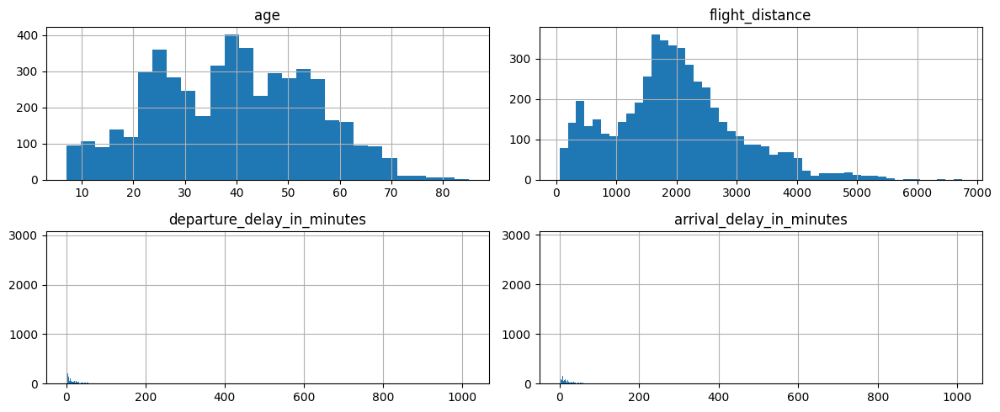

In [18]:
var_num=['age',
         "flight_distance",
         'departure_delay_in_minutes',
         'arrival_delay_in_minutes',]
#take a sample
sample=df_trans_drop_row.sample(n=5000, replace=False, random_state=RANDOM_STATE)

sample[var_num].hist(bins='auto', figsize=(12,5))
plt.tight_layout()
plt.show()

## Fit Models

### Model Fit Strategy

* continuous features: `age`, `flight_distance`, `departure_delay_in_minutes` and `arrival_delay_in_minutes`
* No continuous features: features do not include any continuous features
|Feature|Encoding|Model|
|:-|:-|:-|
|No continuous features|Plan A(most ordinal encoding)|CategoricalNB|
|No continuous features|Plan B(most onehot encoding)|BernoulliNB|


In [19]:
#list to store Naive Bayes model
nb_model_list=[]
#list to store Naive Bayes model name
nb_model_nm_list=[]

#GaussianNB:Used for continuous features, normally distributed features
gnb=GaussianNB()
gnb_model = Pipeline(steps=[
                        ('classifier', gnb)])

#CategoricalNB: Used for categorical features
cnb=CategoricalNB()
cnb_model = Pipeline(steps=[
                        ('classifier', cnb)])

#BernoulliNB: Used for binary/Boolean features
bnb=BernoulliNB()
bnb_model = Pipeline(steps=[
                        ('classifier', bnb)])

In [20]:
#Generate 'No continuous features' feature index
continuous_feature_list=['age','flight_distance','departure_delay_in_minutes','arrival_delay_in_minutes']
no_continuous_feature_index=[]
continuous_feature_index=[]

target_col_list=[]
model_feature_index=[]
for index in range(len(select_col_list)):
    select_feature=select_col_list[index]
    continuous_feature_flg=False
    for continuous_feature in continuous_feature_list:
        if (continuous_feature in select_feature) & (continuous_feature_flg==False):
            continuous_feature_index.append(index+1)
            continuous_feature_flg=True
    if continuous_feature_flg==False:
        no_continuous_feature_index.append(index+1)
    

print(len(select_col_list),len(no_continuous_feature_index),len(continuous_feature_index))
print(f'Continuous feature index: {continuous_feature_index}')
print(f'No continuous feature index: {no_continuous_feature_index}')

89 64 25
Continuous feature index: [1, 2, 3, 4, 5, 6, 7, 8, 9, 18, 19, 28, 29, 38, 39, 48, 49, 58, 59, 68, 69, 78, 79, 88, 89]
No continuous feature index: [10, 11, 12, 13, 14, 15, 16, 17, 20, 21, 22, 23, 24, 25, 26, 27, 30, 31, 32, 33, 34, 35, 36, 37, 40, 41, 42, 43, 44, 45, 46, 47, 50, 51, 52, 53, 54, 55, 56, 57, 60, 61, 62, 63, 64, 65, 66, 67, 70, 71, 72, 73, 74, 75, 76, 77, 80, 81, 82, 83, 84, 85, 86, 87]


In [21]:
####################################################
#target_index:[1]
#df_index:[1,3]
#feature_index:no_continuous_feature_index
####################################################
target_index_list=[1]
feature_index_list=no_continuous_feature_index
df_index_list=[1,3]

for target_index in target_index_list:
    for df_index in df_index_list:
        for feature_index in feature_index_list:
            nb_fit(target_index,df_index,feature_index,cnb_model)

In [22]:
####################################################
#target_index:[1]
#df_index:[2,4]
#feature_index:no_continuous_feature_index
####################################################
target_index_list=[1]
feature_index_list=no_continuous_feature_index
df_index_list=[2,4]

for target_index in target_index_list:
    for df_index in df_index_list:
        for feature_index in feature_index_list:
            nb_fit(target_index,df_index,feature_index,bnb_model)

In [23]:
###################################################
#Read from pickle
###################################################
target_len=len(depedent_variables)
feature_len=list(range(1,len(select_col_list)+1))
df_len=len(df_encode_list)
encoding_type='mix'
nb_model_list,nb_model_nm_list=nb_read_model_pickle(target_len,[1,2,3,4],feature_len, encoding_type,path_nb_tmp)

In [24]:
###################################################
#Training Results
###################################################
nb_model_train_score_list=[]
for nb_model, index in zip(nb_model_list, range(len(nb_model_list))):
    model_name=nb_model_nm_list[index]
    #pickle file nb_mix*_df*_cvXX_hyp*_gs* XX was index
    params_index=find_number(model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'nb_mix' in model_name:
        target_index=find_number(model_name, 'nb_mix')[0]-1
        df_index=find_number(model_name, '_df')[0]-1
        X_train=X_train_list[df_index]
        y_train=y_train_list[df_index]
        select_features=get_fit_features(select_col,X_train.columns)
        #print(model_name,select_col,select_features,df_index)
        nb_y_preds=nb_model.predict(X_train[select_features])
        nb_y_proba= nb_model.predict_proba(X_train[select_features])
        num_params=len(select_col)
        train_score=get_test_scores(model_name, nb_y_preds, y_train,nb_y_proba[:,1])
    nb_model_train_score_list.append(train_score)

nb_model_train_score=pd.concat(nb_model_train_score_list).reset_index(drop=True)
nb_model_train_score.to_csv('nb_model_train_score.csv', index=False)
nb_model_train_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10,0.709134,0.702297,0.705699,0.679349,0.713094
1,nb_mix1_df2_cv10,0.702779,0.663665,0.682662,0.662243,0.700839
2,nb_mix1_df3_cv10,0.704070,0.701726,0.702896,0.675316,0.709535
3,nb_mix1_df4_cv10,0.699267,0.660133,0.679137,0.658595,0.699006
4,nb_mix1_df1_cv11,0.700131,0.726422,0.713034,0.679928,0.701012
...,...,...,...,...,...,...
251,nb_mix1_df4_cv86,0.852901,0.814968,0.833503,0.821797,0.900707
252,nb_mix1_df1_cv87,0.840985,0.829951,0.835432,0.821011,0.899107
253,nb_mix1_df2_cv87,0.851194,0.821392,0.836028,0.823624,0.900866
254,nb_mix1_df3_cv87,0.839896,0.830207,0.835023,0.820450,0.899185


In [25]:
#show df1:X_list[0]
nb_model_train_score[nb_model_train_score['model'].str.contains('df1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10,0.709134,0.702297,0.705699,0.679349,0.713094
4,nb_mix1_df1_cv11,0.700131,0.726422,0.713034,0.679928,0.701012
8,nb_mix1_df1_cv12,0.712274,0.699311,0.705733,0.680765,0.712565
12,nb_mix1_df1_cv13,0.700070,0.726540,0.713059,0.679916,0.699946
16,nb_mix1_df1_cv14,0.702668,0.697265,0.699956,0.672772,0.710396
20,nb_mix1_df1_cv15,0.701374,0.702133,0.701753,0.673300,0.693310
24,nb_mix1_df1_cv16,0.708945,0.688025,0.698328,0.674600,0.709681
28,nb_mix1_df1_cv17,0.701374,0.702133,0.701753,0.673300,0.692133
32,nb_mix1_df1_cv20,0.697981,0.729032,0.713168,0.678989,0.740648
36,nb_mix1_df1_cv21,0.738283,0.684850,0.710564,0.694589,0.741155


In [26]:
#show df2:X_list[1]
nb_model_train_score[nb_model_train_score['model'].str.contains('df2')]

,model,precision,recall,F1,accuracy,ROC_AUC
1,nb_mix1_df2_cv10,0.702779,0.663665,0.682662,0.662243,0.700839
5,nb_mix1_df2_cv11,0.678817,0.727739,0.702427,0.662475,0.687448
9,nb_mix1_df2_cv12,0.701195,0.708928,0.705041,0.675295,0.705218
13,nb_mix1_df2_cv13,0.696359,0.685814,0.691047,0.664316,0.688756
17,nb_mix1_df2_cv14,0.716668,0.631569,0.671433,0.661638,0.703934
21,nb_mix1_df2_cv15,0.685046,0.714571,0.699497,0.663916,0.692061
25,nb_mix1_df2_cv16,0.714173,0.678102,0.695670,0.675230,0.708627
29,nb_mix1_df2_cv17,0.703875,0.685156,0.694389,0.669863,0.693787
33,nb_mix1_df2_cv20,0.687605,0.734346,0.710207,0.671948,0.728337
37,nb_mix1_df2_cv21,0.713748,0.713631,0.713689,0.686570,0.728906


In [27]:
#show df3:X_list[2]
nb_model_train_score[nb_model_train_score['model'].str.contains('df3')]

,model,precision,recall,F1,accuracy,ROC_AUC
2,nb_mix1_df3_cv10,0.704070,0.701726,0.702896,0.675316,0.709535
6,nb_mix1_df3_cv11,0.695433,0.712276,0.703754,0.671787,0.699080
10,nb_mix1_df3_cv12,0.707867,0.697693,0.702743,0.676945,0.709224
14,nb_mix1_df3_cv13,0.696858,0.723342,0.709853,0.676355,0.698198
18,nb_mix1_df3_cv14,0.697512,0.696122,0.696816,0.668450,0.705493
22,nb_mix1_df3_cv15,0.697877,0.699709,0.698792,0.669849,0.691237
26,nb_mix1_df3_cv16,0.704563,0.685665,0.694986,0.670593,0.704872
30,nb_mix1_df3_cv17,0.697877,0.699709,0.698792,0.669849,0.690116
34,nb_mix1_df3_cv20,0.697081,0.725617,0.711063,0.677241,0.738325
38,nb_mix1_df3_cv21,0.737406,0.677811,0.706354,0.691549,0.739671


In [28]:
#show df4:X_list[3]
nb_model_train_score[nb_model_train_score['model'].str.contains('df4')]

,model,precision,recall,F1,accuracy,ROC_AUC
3,nb_mix1_df4_cv10,0.699267,0.660133,0.679137,0.658595,0.699006
7,nb_mix1_df4_cv11,0.675401,0.715558,0.694900,0.656093,0.685820
11,nb_mix1_df4_cv12,0.697538,0.704914,0.701207,0.671196,0.702303
15,nb_mix1_df4_cv13,0.692352,0.683813,0.688056,0.660635,0.686972
19,nb_mix1_df4_cv14,0.712083,0.632397,0.669879,0.658852,0.700383
23,nb_mix1_df4_cv15,0.682218,0.711760,0.696676,0.660777,0.689242
27,nb_mix1_df4_cv16,0.710988,0.674365,0.692192,0.671735,0.703608
31,nb_mix1_df4_cv17,0.700238,0.682031,0.691015,0.666166,0.690769
35,nb_mix1_df4_cv20,0.684810,0.733330,0.708240,0.669310,0.727332
39,nb_mix1_df4_cv21,0.712801,0.709041,0.710916,0.684388,0.727759


In [29]:
###################################################
#Validation Results
###################################################
nb_model_val_score_list=[]
for nb_model, index in zip(nb_model_list, range(len(nb_model_list))):
    model_name=nb_model_nm_list[index]
    #pickle file nb_mix*_df*_cvXX_hyp*_gs* XX was index
    params_index=find_number(model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    
    if 'nb_mix' in model_name:
        target_index=find_number(model_name, 'nb_mix')[0]-1
        df_index=find_number(model_name, '_df')[0]-1
        X_val=X_val_list[df_index]
        y_val=y_val_list[df_index]
        select_features=get_fit_features(select_col,X_val.columns)
        nb_y_preds=nb_model.predict(X_val[select_features])
        nb_y_proba= nb_model.predict_proba(X_val[select_features])
        num_params=len(select_col)
        val_score=get_test_scores(model_name, nb_y_preds, y_val,nb_y_proba[:,1])
    nb_model_val_score_list.append(val_score)

nb_model_val_score=pd.concat(nb_model_val_score_list).reset_index(drop=True)
nb_model_val_score.to_csv('nb_model_val_score.csv', index=False)
nb_model_val_score


,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10,0.702221,0.696012,0.699103,0.672038,0.706796
1,nb_mix1_df2_cv10,0.694270,0.655286,0.674215,0.653349,0.694946
2,nb_mix1_df3_cv10,0.712513,0.710776,0.711643,0.684735,0.717815
3,nb_mix1_df4_cv10,0.707025,0.669230,0.687608,0.667180,0.707196
4,nb_mix1_df1_cv11,0.693165,0.719244,0.705964,0.672038,0.695783
...,...,...,...,...,...,...
251,nb_mix1_df4_cv86,0.851566,0.818344,0.834625,0.822503,0.901757
252,nb_mix1_df1_cv87,0.841984,0.826938,0.834393,0.820316,0.899348
253,nb_mix1_df2_cv87,0.854001,0.818096,0.835663,0.823869,0.901061
254,nb_mix1_df3_cv87,0.837378,0.834943,0.836159,0.820912,0.899429


In [30]:
#show df1:X_list[0]
nb_model_val_score[nb_model_val_score['model'].str.contains('df1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10,0.702221,0.696012,0.699103,0.672038,0.706796
4,nb_mix1_df1_cv11,0.693165,0.719244,0.705964,0.672038,0.695783
8,nb_mix1_df1_cv12,0.704391,0.692532,0.698411,0.672605,0.706342
12,nb_mix1_df1_cv13,0.693040,0.719244,0.705899,0.671935,0.694799
16,nb_mix1_df1_cv14,0.697096,0.693096,0.695090,0.667147,0.704693
20,nb_mix1_df1_cv15,0.694543,0.696764,0.695652,0.666272,0.689314
24,nb_mix1_df1_cv16,0.701829,0.682092,0.691820,0.667353,0.704087
28,nb_mix1_df1_cv17,0.694543,0.696764,0.695652,0.666272,0.688183
32,nb_mix1_df1_cv20,0.697704,0.725922,0.711533,0.677805,0.735838
36,nb_mix1_df1_cv21,0.733224,0.675226,0.703031,0.687741,0.737288


In [31]:
#show df2:X_list[1]
nb_model_val_score[nb_model_val_score['model'].str.contains('df2')]

,model,precision,recall,F1,accuracy,ROC_AUC
1,nb_mix1_df2_cv10,0.694270,0.655286,0.674215,0.653349,0.694946
5,nb_mix1_df2_cv11,0.671737,0.722724,0.696298,0.654894,0.681103
9,nb_mix1_df2_cv12,0.692936,0.702126,0.697501,0.666632,0.699089
13,nb_mix1_df2_cv13,0.688010,0.682186,0.685085,0.656696,0.683434
17,nb_mix1_df2_cv14,0.709056,0.626693,0.665335,0.654894,0.698405
21,nb_mix1_df2_cv15,0.679286,0.712190,0.695349,0.658395,0.686474
25,nb_mix1_df2_cv16,0.706701,0.673533,0.689718,0.668280,0.702822
29,nb_mix1_df2_cv17,0.697241,0.682092,0.689583,0.663852,0.689154
33,nb_mix1_df2_cv20,0.685835,0.731377,0.707874,0.669567,0.723754
37,nb_mix1_df2_cv21,0.707511,0.704383,0.705943,0.678783,0.724182


In [32]:
#show df3:X_list[2]
nb_model_val_score[nb_model_val_score['model'].str.contains('df3')]

,model,precision,recall,F1,accuracy,ROC_AUC
2,nb_mix1_df3_cv10,0.712513,0.710776,0.711643,0.684735,0.717815
6,nb_mix1_df3_cv11,0.703959,0.718747,0.711276,0.680628,0.707862
10,nb_mix1_df3_cv12,0.715887,0.706555,0.711191,0.685915,0.717408
14,nb_mix1_df3_cv13,0.705402,0.729813,0.717400,0.685299,0.706749
18,nb_mix1_df3_cv14,0.705644,0.703461,0.704551,0.677087,0.714153
22,nb_mix1_df3_cv15,0.705309,0.705242,0.705275,0.677395,0.699731
26,nb_mix1_df3_cv16,0.712495,0.693051,0.702638,0.678934,0.713373
30,nb_mix1_df3_cv17,0.705309,0.705242,0.705275,0.677395,0.698412
34,nb_mix1_df3_cv20,0.698105,0.735815,0.716464,0.681244,0.744061
38,nb_mix1_df3_cv21,0.741736,0.686017,0.712789,0.697413,0.745983


In [33]:
#show df4:X_list[3]
nb_model_val_score[nb_model_val_score['model'].str.contains('df4')]

,model,precision,recall,F1,accuracy,ROC_AUC
3,nb_mix1_df4_cv10,0.707025,0.669230,0.687608,0.667180,0.707196
7,nb_mix1_df4_cv11,0.681726,0.725968,0.703152,0.664511,0.692899
11,nb_mix1_df4_cv12,0.706177,0.714058,0.710096,0.680885,0.710312
15,nb_mix1_df4_cv13,0.699291,0.694176,0.696724,0.669233,0.694198
19,nb_mix1_df4_cv14,0.719200,0.641095,0.677906,0.666564,0.710016
23,nb_mix1_df4_cv15,0.689479,0.720904,0.704841,0.669541,0.697517
27,nb_mix1_df4_cv16,0.718427,0.683391,0.700471,0.680115,0.712823
31,nb_mix1_df4_cv17,0.708895,0.690612,0.699634,0.675444,0.698707
35,nb_mix1_df4_cv20,0.685902,0.744631,0.714061,0.673596,0.733234
39,nb_mix1_df4_cv21,0.714539,0.719028,0.716777,0.688995,0.733080


In [34]:
feature_index_map={
    "customer_type+age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes":
    [2,80,81,82,83,84,85,86,87,88,89],
    "age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes":
    [3,70,71,72,73,74,75,76,77,78,79],
    "customer_type+age+class+flight_distance+rating items+departure_delay_in_minutes":
    [4,60,61,62,63,64,65,66,67,68,69],
    "customer_type+age+type_of_travel+class+flight_distance+departure_delay_in_minutes":
    [5,50,51,52,53,54,55,56,57,58,59],
    "age+class+flight_distance+rating items+departure_delay_in_minutes":
    [6,40,41,42,43,44,45,46,47,48,49],
    "age+type_of_travel+class+flight_distance+departure_delay_in_minutes":
    [7,30,31,32,33,34,35,36,37,38,39],
    "customer_type+age+class+flight_distance+departure_delay_in_minutes":
    [8,20,21,22,23,24,25,26,27,28,29],
    "age+class+flight_distance+departure_delay_in_minutes":
    [9,10,11,12,13,14,15,16,17,18,19]  
}

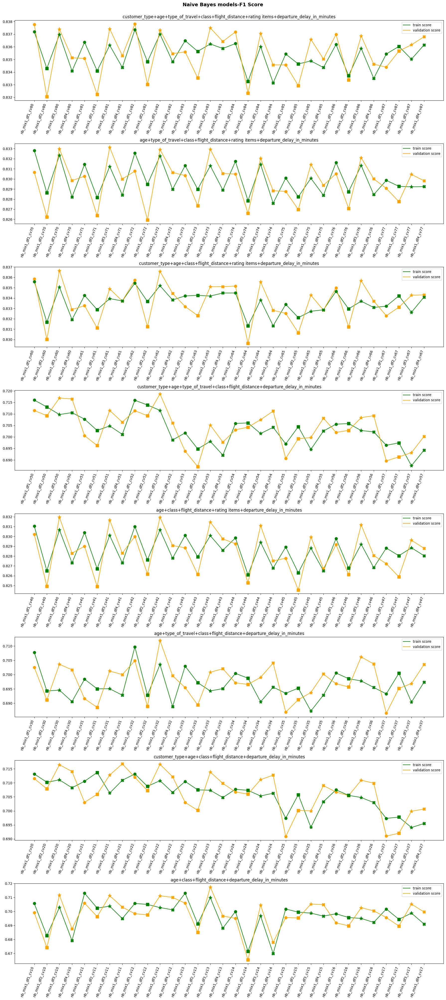

In [35]:
##############################################
#Show Trian and Validation Results
#F1 score
##############################################
fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']
metric='F1'

for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_model_train_score['feature_index']=nb_model_train_score['model'].str.extract(r'_cv(\d+)').astype(int)
    nb_model_val_score['feature_index']=nb_model_val_score['model'].str.extract(r'_cv(\d+)').astype(int)
    mask_train=nb_model_train_score['feature_index'].isin(feature_index)
    mask_val=nb_model_val_score['feature_index'].isin(feature_index)
    filtered_nb_model_train_score=nb_model_train_score[mask_train]
    filtered_nb_model_val_score=nb_model_val_score[mask_val]
    #plot train scores
    ax.plot(filtered_nb_model_train_score['model'], filtered_nb_model_train_score[metric], color='green', label='train score')
    #plot validation scores
    ax.plot(filtered_nb_model_val_score['model'], filtered_nb_model_val_score[metric], color='orange', label='validation score')

    substr_list=[
        '_df1_',
        '_df2_',
        '_df3_',
        '_df4_',
    ]
    marker_list=['o','s','*','X']
    markersize_list=[8,8,11,8]
    for substr,unit_marker, unit_marker_size in zip(substr_list,marker_list,markersize_list):
        ax.plot(filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)]['model'], filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)][metric], unit_marker,color='orange',markersize=unit_marker_size)
        ax.plot(filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)]['model'], filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)][metric], unit_marker,color='green',markersize=unit_marker_size,label=substr)

    
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models-F1 Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()


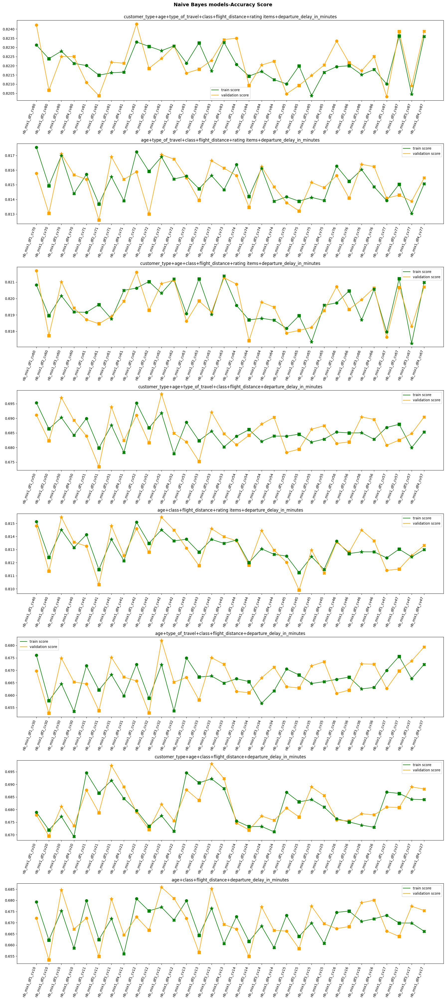

In [36]:
##############################################
#Show Trian and Validation Results
#Accuracy score
##############################################
fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']
metric='accuracy'

for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_model_train_score['feature_index']=nb_model_train_score['model'].str.extract(r'_cv(\d+)').astype(int)
    nb_model_val_score['feature_index']=nb_model_val_score['model'].str.extract(r'_cv(\d+)').astype(int)
    mask_train=nb_model_train_score['feature_index'].isin(feature_index)
    mask_val=nb_model_val_score['feature_index'].isin(feature_index)
    filtered_nb_model_train_score=nb_model_train_score[mask_train]
    filtered_nb_model_val_score=nb_model_val_score[mask_val]
    #plot train scores
    ax.plot(filtered_nb_model_train_score['model'], filtered_nb_model_train_score[metric], color='green', label='train score')
    #plot validation scores
    ax.plot(filtered_nb_model_val_score['model'], filtered_nb_model_val_score[metric], color='orange', label='validation score')

    substr_list=[
        '_df1_',
        '_df2_',
        '_df3_',
        '_df4_',
    ]
    marker_list=['o','s','*','X']
    markersize_list=[8,8,11,8]
    for substr,unit_marker, unit_marker_size in zip(substr_list,marker_list,markersize_list):
        ax.plot(filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)]['model'], filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)][metric], unit_marker,color='orange',markersize=unit_marker_size)
        ax.plot(filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)]['model'], filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)][metric], unit_marker,color='green',markersize=unit_marker_size,label=substr)

    
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models-Accuracy Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()

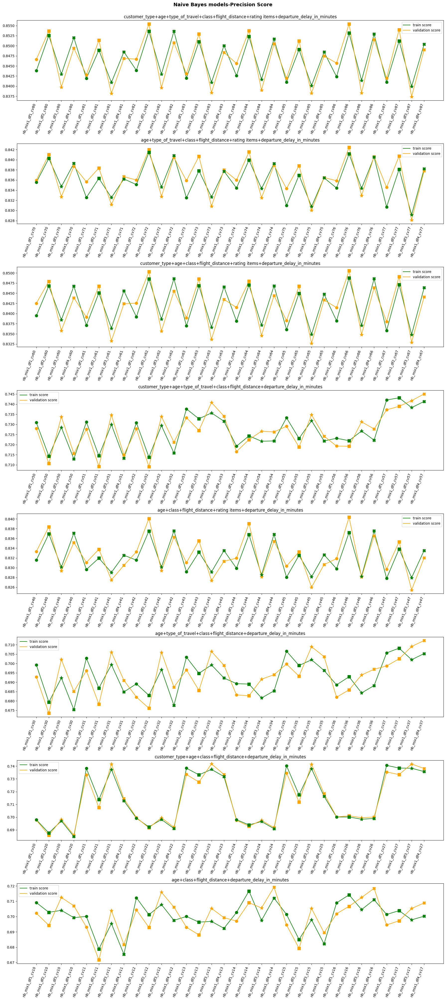

In [37]:
##############################################
#Show Trian and Validation Results
#Precision score
##############################################
fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']
metric='precision'

for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_model_train_score['feature_index']=nb_model_train_score['model'].str.extract(r'_cv(\d+)').astype(int)
    nb_model_val_score['feature_index']=nb_model_val_score['model'].str.extract(r'_cv(\d+)').astype(int)
    mask_train=nb_model_train_score['feature_index'].isin(feature_index)
    mask_val=nb_model_val_score['feature_index'].isin(feature_index)
    filtered_nb_model_train_score=nb_model_train_score[mask_train]
    filtered_nb_model_val_score=nb_model_val_score[mask_val]
    #plot train scores
    ax.plot(filtered_nb_model_train_score['model'], filtered_nb_model_train_score[metric], color='green', label='train score')
    #plot validation scores
    ax.plot(filtered_nb_model_val_score['model'], filtered_nb_model_val_score[metric], color='orange', label='validation score')

    substr_list=[
        '_df1_',
        '_df2_',
        '_df3_',
        '_df4_',
    ]
    marker_list=['o','s','*','X']
    markersize_list=[8,8,11,8]
    for substr,unit_marker, unit_marker_size in zip(substr_list,marker_list,markersize_list):
        ax.plot(filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)]['model'], filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)][metric], unit_marker,color='orange',markersize=unit_marker_size)
        ax.plot(filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)]['model'], filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)][metric], unit_marker,color='green',markersize=unit_marker_size,label=substr)

    
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models-Precision Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()

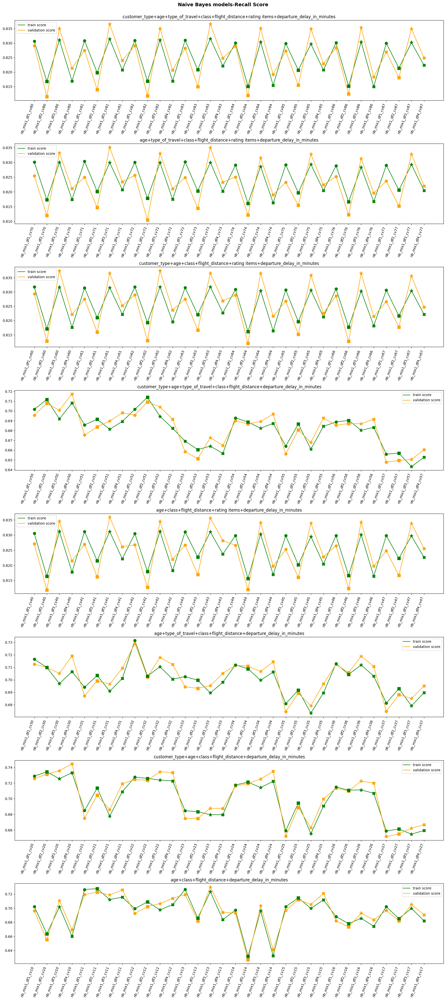

In [38]:
##############################################
#Show Trian and Validation Results
#Recall score
##############################################
fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']
metric='recall'

for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_model_train_score['feature_index']=nb_model_train_score['model'].str.extract(r'_cv(\d+)').astype(int)
    nb_model_val_score['feature_index']=nb_model_val_score['model'].str.extract(r'_cv(\d+)').astype(int)
    mask_train=nb_model_train_score['feature_index'].isin(feature_index)
    mask_val=nb_model_val_score['feature_index'].isin(feature_index)
    filtered_nb_model_train_score=nb_model_train_score[mask_train]
    filtered_nb_model_val_score=nb_model_val_score[mask_val]
    #plot train scores
    ax.plot(filtered_nb_model_train_score['model'], filtered_nb_model_train_score[metric], color='green', label='train score')
    #plot validation scores
    ax.plot(filtered_nb_model_val_score['model'], filtered_nb_model_val_score[metric], color='orange', label='validation score')

    substr_list=[
        '_df1_',
        '_df2_',
        '_df3_',
        '_df4_',
    ]
    marker_list=['o','s','*','X']
    markersize_list=[8,8,11,8]
    for substr,unit_marker, unit_marker_size in zip(substr_list,marker_list,markersize_list):
        ax.plot(filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)]['model'], filtered_nb_model_val_score[filtered_nb_model_val_score['model'].str.contains(substr)][metric], unit_marker,color='orange',markersize=unit_marker_size)
        ax.plot(filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)]['model'], filtered_nb_model_train_score[filtered_nb_model_train_score['model'].str.contains(substr)][metric], unit_marker,color='green',markersize=unit_marker_size,label=substr)

    
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models-Recall Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()

## Tune Hyperparmeter


In this scenario, assume we need to balance false positive and false positive<BR/>
use `f1` to refit


In [39]:
#Scaling
nb_cv_params_list=[
    #index:1
    {'alpha': [0.00001, 0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10,20, 50, 100,1000,10000,100000]
    },
]


#GaussianNB:Used for continuous features, normally distributed features
gnb=GaussianNB()
gnb_model = Pipeline(steps=[
                        ('classifier', gnb)])

#CategoricalNB: Used for categorical features
cnb=CategoricalNB()
cnb_model = Pipeline(steps=[
                        ('classifier', cnb)])

#BernoulliNB: Used for binary/Boolean features
bnb=BernoulliNB()
bnb_model = Pipeline(steps=[
                        ('classifier', bnb)])

In [40]:
####################################################
#target_index:[1]
#df_index:[1,3]
#feature_index:no_continuous_feature_index
#hyparameter index: [1]
#GridSearchCV index: [1]
#cv:5
####################################################
target_index_list=[1]
feature_index_list=no_continuous_feature_index
df_index_list=[1,3]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for df_index in df_index_list:
        for feature_index in feature_index_list:
            for hyp_index in hyp_index_list:
                nb_grid_fit(target_index,df_index,feature_index, hyp_index, 1, encoding_type='mix',nb_regressor=cnb_model,cv=5, refit='f1')


2025-05-30 03:33:09.714719: Fit Start
Fitting 5 folds for each of 16 candidates, totalling 80 fits
**************Fit parameters******************
select_col:  ['age_range', 'class', 'flight_distance_range', 'departure_delay_class']
select_feature:  ['age_range', 'class', 'flight_distance_range', 'departure_delay_class']
hyp_params:  {'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10, 20, 50, 100, 1000, 10000, 100000]}
cv:  5
refit:  f1
pickle file name:  nb_mix1_df1_cv10_hyp1_gs1
**************Fit parameters******************
2025-05-30 03:33:14.068809: Fit End
Fit duration: 0 min 4 s
2025-05-30 03:33:14.069178: Fit Start
Fitting 5 folds for each of 16 candidates, totalling 80 fits
**************Fit parameters******************
select_col:  ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class']
select_feature:  ['age_class_by_airline', 'class', 'flight_distance_range', 'departure_delay_class']
hyp_params:  {'alpha': [1e-05, 0.0001, 0.001, 0.

In [41]:
####################################################
#target_index:[1]
#df_index:[2,4]
#feature_index:no_continuous_feature_index
#hyparameter index: [1]
#GridSearchCV index: [1]
#cv:5
####################################################
target_index_list=[1]
feature_index_list=no_continuous_feature_index
df_index_list=[2,4]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for df_index in df_index_list:
        for feature_index in feature_index_list:
            for hyp_index in hyp_index_list:
                nb_grid_fit(target_index,df_index,feature_index, hyp_index, 1, encoding_type='mix',nb_regressor=bnb_model,cv=5, refit='f1')


2025-05-30 03:38:32.218249: Fit Start
Fitting 5 folds for each of 16 candidates, totalling 80 fits
**************Fit parameters******************
select_col:  ['age_range', 'class', 'flight_distance_range', 'departure_delay_class']
select_feature:  ['age_range_dummy_gte70', 'age_range_dummy_10_20', 'age_range_dummy_20_30', 'age_range_dummy_30_40', 'age_range_dummy_40_50', 'age_range_dummy_50_60', 'age_range_dummy_60_70', 'class_dummy_eco', 'class_dummy_eco_plus', 'flight_distance_range_dummy_gte4k', 'flight_distance_range_dummy_1k_3k', 'flight_distance_range_dummy_3k_4k', 'departure_delay_class_dummy_moderate_delay', 'departure_delay_class_dummy_no_delay', 'departure_delay_class_dummy_significant_delay']
hyp_params:  {'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1, 0.5, 1.0, 2.0, 5.0, 10, 20, 50, 100, 1000, 10000, 100000]}
cv:  5
refit:  f1
pickle file name:  nb_mix1_df2_cv10_hyp1_gs1
**************Fit parameters******************
2025-05-30 03:38:35.349469: Fit End
Fit duration: 0 min 3 s


In [42]:
%%script True
####################################################
#target_index:[1]
#df_index:[2,4]
#feature_index:[10-73] 
#hyparameter index: [1]
#GridSearchCV index: [1]
#cv:5
#Scaling
####################################################
target_index_list=[1]
feature_index_list=range(10,74)
#feature_index_list=[2]
df_index_list=[2,4]
#hyparameter index,start from 1
hyp_index_list=[1]

for target_index in target_index_list:
    for df_index in df_index_list:
        for feature_index in feature_index_list:
            for hyp_index in hyp_index_list:
                nb_grid_fit(target_index,df_index,feature_index, hyp_index, 1, encoding_type='mix',nb_regressor=nb_model,cv=5, refit='f1')


Couldn't find program: 'True'


## Results and evaluation

### Naive Bayes

In [43]:
###################################################
#Read from pickle
#Scaling
###################################################
target_len=len(depedent_variables)
feature_len=len(select_col_list)
#feature_len=list(range(10,74))
#feature_index_list=model_feature_index
df_len=len(df_encode_list)
#feature_len=1
hyp_len=len(nb_cv_params_list)
gs_len=5
encoding_type='mix'
nb_cv_list,nb_model_name_list=nb_read_pickle(target_len,df_len,feature_index_list, hyp_len, gs_len, encoding_type,path_nb)

In [44]:
###################################################
#Examine the best combination of hyperparameters.
#Scaling
###################################################
nb_best_hyperparameters=pd.DataFrame()
for index in range(len(nb_cv_list)):
    nb_row=nb_cv_list[index].best_params_
    nb_row['nb Model name']=nb_model_name_list[index]
    df_dictionary = pd.DataFrame([nb_row])
    nb_best_hyperparameters = pd.concat([nb_best_hyperparameters, df_dictionary], ignore_index=True)

nb_best_hyperparameters.to_csv('nb_best_hyperparameters.csv', index=False)
nb_best_hyperparameters

,classifier__alpha,nb Model name
0,10000.0,nb_mix1_df1_cv10_hyp1_gs1
1,10000.0,nb_mix1_df2_cv10_hyp1_gs1
2,10000.0,nb_mix1_df3_cv10_hyp1_gs1
3,10000.0,nb_mix1_df4_cv10_hyp1_gs1
4,10000.0,nb_mix1_df1_cv11_hyp1_gs1
...,...,...
251,1000.0,nb_mix1_df4_cv86_hyp1_gs1
252,1000.0,nb_mix1_df1_cv87_hyp1_gs1
253,1000.0,nb_mix1_df2_cv87_hyp1_gs1
254,1000.0,nb_mix1_df3_cv87_hyp1_gs1


In [45]:
#show df1:X_list[0]
nb_best_hyperparameters[nb_best_hyperparameters['nb Model name'].str.contains('df1')]

,classifier__alpha,nb Model name
0,10000.00000,nb_mix1_df1_cv10_hyp1_gs1
4,10000.00000,nb_mix1_df1_cv11_hyp1_gs1
8,1000.00000,nb_mix1_df1_cv12_hyp1_gs1
12,100.00000,nb_mix1_df1_cv13_hyp1_gs1
16,100000.00000,nb_mix1_df1_cv14_hyp1_gs1
20,100000.00000,nb_mix1_df1_cv15_hyp1_gs1
24,100000.00000,nb_mix1_df1_cv16_hyp1_gs1
28,100000.00000,nb_mix1_df1_cv17_hyp1_gs1
32,100000.00000,nb_mix1_df1_cv20_hyp1_gs1
36,10000.00000,nb_mix1_df1_cv21_hyp1_gs1


In [46]:
#show df2:X_list[1]
nb_best_hyperparameters[nb_best_hyperparameters['nb Model name'].str.contains('df2')]

,classifier__alpha,nb Model name
1,10000.0,nb_mix1_df2_cv10_hyp1_gs1
5,10000.0,nb_mix1_df2_cv11_hyp1_gs1
9,10000.0,nb_mix1_df2_cv12_hyp1_gs1
13,10000.0,nb_mix1_df2_cv13_hyp1_gs1
17,10000.0,nb_mix1_df2_cv14_hyp1_gs1
21,100000.0,nb_mix1_df2_cv15_hyp1_gs1
25,100000.0,nb_mix1_df2_cv16_hyp1_gs1
29,100000.0,nb_mix1_df2_cv17_hyp1_gs1
33,10000.0,nb_mix1_df2_cv20_hyp1_gs1
37,10000.0,nb_mix1_df2_cv21_hyp1_gs1


In [47]:
#show df3:X_list[2]
nb_best_hyperparameters[nb_best_hyperparameters['nb Model name'].str.contains('df3')]

,classifier__alpha,nb Model name
2,10000.0,nb_mix1_df3_cv10_hyp1_gs1
6,10000.0,nb_mix1_df3_cv11_hyp1_gs1
10,100000.0,nb_mix1_df3_cv12_hyp1_gs1
14,1000.0,nb_mix1_df3_cv13_hyp1_gs1
18,100000.0,nb_mix1_df3_cv14_hyp1_gs1
22,100000.0,nb_mix1_df3_cv15_hyp1_gs1
26,100000.0,nb_mix1_df3_cv16_hyp1_gs1
30,100000.0,nb_mix1_df3_cv17_hyp1_gs1
34,100000.0,nb_mix1_df3_cv20_hyp1_gs1
38,10000.0,nb_mix1_df3_cv21_hyp1_gs1


In [48]:
#show df4:X_list[3]
nb_best_hyperparameters[nb_best_hyperparameters['nb Model name'].str.contains('df4')]

,classifier__alpha,nb Model name
3,10000.0,nb_mix1_df4_cv10_hyp1_gs1
7,10000.0,nb_mix1_df4_cv11_hyp1_gs1
11,10000.0,nb_mix1_df4_cv12_hyp1_gs1
15,10000.0,nb_mix1_df4_cv13_hyp1_gs1
19,10000.0,nb_mix1_df4_cv14_hyp1_gs1
23,100000.0,nb_mix1_df4_cv15_hyp1_gs1
27,100000.0,nb_mix1_df4_cv16_hyp1_gs1
31,100000.0,nb_mix1_df4_cv17_hyp1_gs1
35,10000.0,nb_mix1_df4_cv20_hyp1_gs1
39,10000.0,nb_mix1_df4_cv21_hyp1_gs1


In [49]:
###################################################
#Training Results
#Scaling
###################################################
nb_train_score_list=[]
for nb_cv, index in zip(nb_cv_list, range(len(nb_cv_list))):
    nb_best=nb_cv.best_estimator_
    model_name=nb_model_name_list[index]
    #pickle file nb_mix*_df*_cvXX_hyp*_gs* XX was index
    params_index=find_number(model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'nb_mix' in model_name:
        target_index=find_number(model_name, 'nb_mix')[0]-1
        df_index=find_number(model_name, '_df')[0]-1
        X_train=X_train_list[df_index]
        y_train=y_train_list[df_index]
        select_features=get_fit_features(select_col,X_train.columns)
        #print(model_name,select_col,select_features,df_index)
        nb_y_preds=nb_best.predict(X_train[select_features])
        nb_y_proba= nb_best.predict_proba(X_train[select_features])
        num_params=len(select_col)
        train_score=get_test_scores(model_name, nb_y_preds, y_train,nb_y_proba[:,1])
    nb_train_score_list.append(train_score)

nb_train_score=pd.concat(nb_train_score_list).reset_index(drop=True)
nb_train_score.to_csv('nb_train_score.csv', index=False)
nb_train_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10_hyp1_gs1,0.695819,0.727151,0.711140,0.676633,0.712668
1,nb_mix1_df2_cv10_hyp1_gs1,0.636908,0.812740,0.714160,0.643863,0.706023
2,nb_mix1_df3_cv10_hyp1_gs1,0.693982,0.722733,0.708066,0.673814,0.709732
3,nb_mix1_df4_cv10_hyp1_gs1,0.635244,0.810513,0.712255,0.641567,0.702187
4,nb_mix1_df1_cv11_hyp1_gs1,0.680774,0.756072,0.716450,0.672399,0.701175
...,...,...,...,...,...,...
251,nb_mix1_df4_cv86_hyp1_gs1,0.836412,0.837686,0.837049,0.821489,0.899785
252,nb_mix1_df1_cv87_hyp1_gs1,0.830735,0.843354,0.836997,0.820187,0.898825
253,nb_mix1_df2_cv87_hyp1_gs1,0.835111,0.843260,0.839166,0.823058,0.899841
254,nb_mix1_df3_cv87_hyp1_gs1,0.829452,0.843454,0.836394,0.819397,0.898887


In [50]:
#show df1:X_list[0]
nb_train_score[nb_train_score['model'].str.contains('df1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10_hyp1_gs1,0.695819,0.727151,0.711140,0.676633,0.712668
4,nb_mix1_df1_cv11_hyp1_gs1,0.680774,0.756072,0.716450,0.672399,0.701175
8,nb_mix1_df1_cv12_hyp1_gs1,0.704982,0.716734,0.710810,0.680752,0.714099
12,nb_mix1_df1_cv13_hyp1_gs1,0.699799,0.727245,0.713258,0.679916,0.700257
16,nb_mix1_df1_cv14_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.706414
20,nb_mix1_df1_cv15_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.687535
24,nb_mix1_df1_cv16_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.706544
28,nb_mix1_df1_cv17_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.687008
32,nb_mix1_df1_cv20_hyp1_gs1,0.579515,0.975946,0.727212,0.599199,0.741598
36,nb_mix1_df1_cv21_hyp1_gs1,0.633875,0.885419,0.738824,0.657326,0.741223


In [51]:
#show df2:X_list[1]
nb_train_score[nb_train_score['model'].str.contains('df2')]

,model,precision,recall,F1,accuracy,ROC_AUC
1,nb_mix1_df2_cv10_hyp1_gs1,0.636908,0.812740,0.714160,0.643863,0.706023
5,nb_mix1_df2_cv11_hyp1_gs1,0.667136,0.769240,0.714559,0.663582,0.692327
9,nb_mix1_df2_cv12_hyp1_gs1,0.651677,0.778598,0.709506,0.650994,0.709880
13,nb_mix1_df2_cv13_hyp1_gs1,0.692053,0.731172,0.711075,0.674741,0.697640
17,nb_mix1_df2_cv14_hyp1_gs1,0.639007,0.799807,0.710422,0.643078,0.705408
21,nb_mix1_df2_cv15_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.688146
25,nb_mix1_df2_cv16_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.708663
29,nb_mix1_df2_cv17_hyp1_gs1,0.547405,1.000000,0.707514,0.547405,0.692485
33,nb_mix1_df2_cv20_hyp1_gs1,0.645833,0.806650,0.717339,0.652011,0.732257
37,nb_mix1_df2_cv21_hyp1_gs1,0.631625,0.887206,0.737912,0.655010,0.732063


In [52]:
#show df3:X_list[2]
nb_train_score[nb_train_score['model'].str.contains('df3')]

,model,precision,recall,F1,accuracy,ROC_AUC
2,nb_mix1_df3_cv10_hyp1_gs1,0.693982,0.722733,0.708066,0.673814,0.709732
6,nb_mix1_df3_cv11_hyp1_gs1,0.678342,0.752391,0.713450,0.669207,0.697956
10,nb_mix1_df3_cv12_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.708175
14,nb_mix1_df3_cv13_hyp1_gs1,0.697307,0.722991,0.709917,0.676612,0.698950
18,nb_mix1_df3_cv14_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.702825
22,nb_mix1_df3_cv15_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.685352
26,nb_mix1_df3_cv16_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.702957
30,nb_mix1_df3_cv17_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.684701
34,nb_mix1_df3_cv20_hyp1_gs1,0.578764,0.975452,0.726484,0.597988,0.739868
38,nb_mix1_df3_cv21_hyp1_gs1,0.633882,0.884273,0.738429,0.657119,0.738175


In [53]:
#show df4:X_list[3]
nb_train_score[nb_train_score['model'].str.contains('df4')]

,model,precision,recall,F1,accuracy,ROC_AUC
3,nb_mix1_df4_cv10_hyp1_gs1,0.635244,0.810513,0.712255,0.641567,0.702187
7,nb_mix1_df4_cv11_hyp1_gs1,0.665248,0.765802,0.711992,0.660905,0.689824
11,nb_mix1_df4_cv12_hyp1_gs1,0.649513,0.776470,0.707340,0.648329,0.706294
15,nb_mix1_df4_cv13_hyp1_gs1,0.688138,0.728618,0.707800,0.670735,0.695165
19,nb_mix1_df4_cv14_hyp1_gs1,0.636050,0.798626,0.708126,0.639667,0.700761
23,nb_mix1_df4_cv15_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.686118
27,nb_mix1_df4_cv16_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.705115
31,nb_mix1_df4_cv17_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.690452
35,nb_mix1_df4_cv20_hyp1_gs1,0.654940,0.790913,0.716533,0.657492,0.729166
39,nb_mix1_df4_cv21_hyp1_gs1,0.631670,0.885586,0.737382,0.654745,0.729756


In [54]:
###################################################
#Validation Results
###################################################
nb_val_score_list=[]
for nb_cv, index in zip(nb_cv_list, range(len(nb_cv_list))):
    nb_best=nb_cv.best_estimator_
    model_name=nb_model_name_list[index]
    #pickle file nb_mix*_df*_cvXX_hyp*_gs* XX was index
    params_index=find_number(model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    
    if 'nb_mix' in model_name:
        target_index=find_number(model_name, 'nb_mix')[0]-1
        df_index=find_number(model_name, '_df')[0]-1
        X_val=X_val_list[df_index]
        y_val=y_val_list[df_index]
        select_features=get_fit_features(select_col,X_val.columns)
        nb_y_preds=nb_best.predict(X_val[select_features])
        nb_y_proba= nb_best.predict_proba(X_val[select_features])
        num_params=len(select_col)
        val_score=get_test_scores(model_name, nb_y_preds, y_val,nb_y_proba[:,1])
    nb_val_score_list.append(val_score)

nb_val_score=pd.concat(nb_val_score_list).reset_index(drop=True)
nb_val_score.to_csv('nb_val_score.csv', index=False)
nb_val_score

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10_hyp1_gs1,0.689689,0.720372,0.704697,0.669516,0.706153
1,nb_mix1_df2_cv10_hyp1_gs1,0.632720,0.812265,0.711338,0.639139,0.699759
2,nb_mix1_df3_cv10_hyp1_gs1,0.703466,0.729063,0.716036,0.683503,0.718381
3,nb_mix1_df4_cv10_hyp1_gs1,0.639192,0.818906,0.717974,0.647880,0.710473
4,nb_mix1_df1_cv11_hyp1_gs1,0.674631,0.748871,0.709815,0.664830,0.694905
...,...,...,...,...,...,...
251,nb_mix1_df4_cv86_hyp1_gs1,0.833442,0.840008,0.836712,0.820552,0.900933
252,nb_mix1_df1_cv87_hyp1_gs1,0.833256,0.841798,0.837505,0.821191,0.898934
253,nb_mix1_df2_cv87_hyp1_gs1,0.838343,0.839447,0.838895,0.823508,0.899843
254,nb_mix1_df3_cv87_hyp1_gs1,0.828202,0.847698,0.837837,0.820398,0.899096


In [55]:
#show df1:X_list[0]
nb_val_score[nb_val_score['model'].str.contains('df1')]

,model,precision,recall,F1,accuracy,ROC_AUC
0,nb_mix1_df1_cv10_hyp1_gs1,0.689689,0.720372,0.704697,0.669516,0.706153
4,nb_mix1_df1_cv11_hyp1_gs1,0.674631,0.748871,0.709815,0.664830,0.694905
8,nb_mix1_df1_cv12_hyp1_gs1,0.698564,0.709274,0.703878,0.673325,0.707714
12,nb_mix1_df1_cv13_hyp1_gs1,0.692670,0.719902,0.706023,0.671832,0.695192
16,nb_mix1_df1_cv14_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.701015
20,nb_mix1_df1_cv15_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.682841
24,nb_mix1_df1_cv16_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.701500
28,nb_mix1_df1_cv17_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.682290
32,nb_mix1_df1_cv20_hyp1_gs1,0.577242,0.975263,0.725232,0.595480,0.737233
36,nb_mix1_df1_cv21_hyp1_gs1,0.632357,0.885252,0.737733,0.655460,0.735393


In [56]:
#show df2:X_list[1]
nb_val_score[nb_val_score['model'].str.contains('df2')]

,model,precision,recall,F1,accuracy,ROC_AUC
1,nb_mix1_df2_cv10_hyp1_gs1,0.632720,0.812265,0.711338,0.639139,0.699759
5,nb_mix1_df2_cv11_hyp1_gs1,0.658541,0.762227,0.706600,0.653504,0.687382
9,nb_mix1_df2_cv12_hyp1_gs1,0.648151,0.778123,0.707215,0.647325,0.703570
13,nb_mix1_df2_cv13_hyp1_gs1,0.683781,0.725263,0.703912,0.666015,0.692850
17,nb_mix1_df2_cv14_hyp1_gs1,0.635515,0.800132,0.708385,0.639397,0.698817
21,nb_mix1_df2_cv15_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.683330
25,nb_mix1_df2_cv16_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.702442
29,nb_mix1_df2_cv17_hyp1_gs1,0.547392,1.000000,0.707503,0.547392,0.687944
33,nb_mix1_df2_cv20_hyp1_gs1,0.643745,0.803894,0.714961,0.649127,0.727249
37,nb_mix1_df2_cv21_hyp1_gs1,0.630703,0.887980,0.737549,0.654070,0.728353


In [57]:
#show df3:X_list[2]
nb_val_score[nb_val_score['model'].str.contains('df3')]

,model,precision,recall,F1,accuracy,ROC_AUC
2,nb_mix1_df3_cv10_hyp1_gs1,0.703466,0.729063,0.716036,0.683503,0.718381
6,nb_mix1_df3_cv11_hyp1_gs1,0.685480,0.759730,0.720697,0.677702,0.706445
10,nb_mix1_df3_cv12_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.717037
14,nb_mix1_df3_cv13_hyp1_gs1,0.705589,0.729344,0.717270,0.685299,0.707197
18,nb_mix1_df3_cv14_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.711731
22,nb_mix1_df3_cv15_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.694160
26,nb_mix1_df3_cv16_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.711876
30,nb_mix1_df3_cv17_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.693792
34,nb_mix1_df3_cv20_hyp1_gs1,0.579085,0.978899,0.727691,0.599014,0.747035
38,nb_mix1_df3_cv21_hyp1_gs1,0.634259,0.891400,0.741159,0.659224,0.745676


In [58]:
#show df4:X_list[3]
nb_val_score[nb_val_score['model'].str.contains('df4')]

,model,precision,recall,F1,accuracy,ROC_AUC
3,nb_mix1_df4_cv10_hyp1_gs1,0.639192,0.818906,0.717974,0.647880,0.710473
7,nb_mix1_df4_cv11_hyp1_gs1,0.669291,0.773422,0.717598,0.666821,0.697612
11,nb_mix1_df4_cv12_hyp1_gs1,0.655405,0.784113,0.714005,0.656195,0.714172
15,nb_mix1_df4_cv13_hyp1_gs1,0.694277,0.734971,0.714045,0.677805,0.702708
19,nb_mix1_df4_cv14_hyp1_gs1,0.640092,0.807934,0.714286,0.646238,0.709917
23,nb_mix1_df4_cv15_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.694064
27,nb_mix1_df4_cv16_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.714012
31,nb_mix1_df4_cv17_hyp1_gs1,0.547326,1.000000,0.707447,0.547326,0.697678
35,nb_mix1_df4_cv20_hyp1_gs1,0.655832,0.800431,0.720953,0.660866,0.735507
39,nb_mix1_df4_cv21_hyp1_gs1,0.631719,0.892807,0.739906,0.656452,0.735864


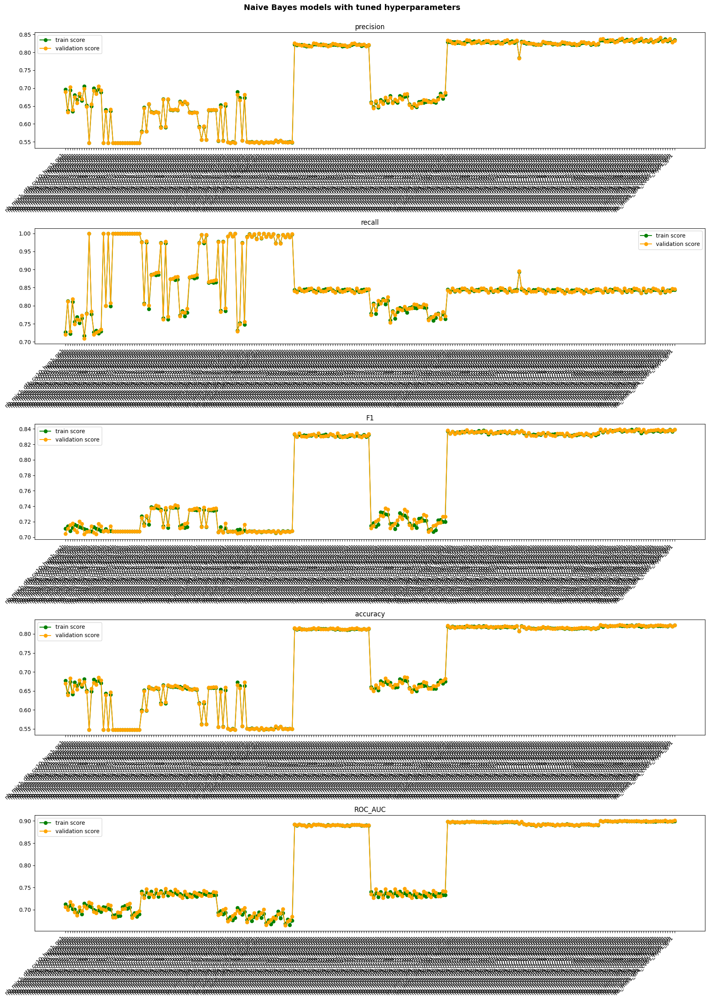

In [59]:
##############################################
#Show Trian and Validation Results
##############################################
fig, axs = plt.subplots(5, 1, figsize=(18,25))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']

for metric, ax in zip(metrics, axs.ravel()):
    #plot train scores
    ax.plot(nb_train_score['model'], nb_train_score[metric], color='green', label='train score',marker='o')
    #plot validation scores
    ax.plot(nb_val_score['model'], nb_val_score[metric], color='orange', label='validation score',marker='o')
    ax.set_title(metric)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models with tuned hyperparameters',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()


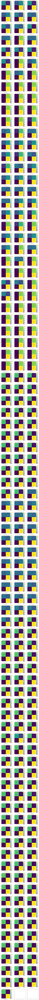

In [60]:
#################################################################################
#Display confusion on validation data
#################################################################################
rowCount=math.ceil(len(nb_cv_list)/3)
fig, axes = plt.subplots(nrows=rowCount, ncols=3, figsize=(16,rowCount*5))

for nb_cv,ax,model_index in zip(nb_cv_list,axes.ravel(),range(len(nb_cv_list))):
    model=nb_cv.best_estimator_
    nb_model_name=nb_model_name_list[model_index]
    
    params_index=find_number(nb_model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()
    df_index=find_number(nb_model_name, '_df')[0]-1
    X_val=X_val_list[df_index]
    y_val=y_val_list[df_index]
    select_features=get_fit_features(select_col,X_val.columns)

    confusion_matrix_plot_ax(model, X_val[select_features], y_val,ax,nb_model_name)

# Test model on test set

* Select champion model
* Fit all train and validation data
* Validate champion model on test set

### Naive Bayes

In [61]:
%%script True
#########################################################
#Potential Champion model
#########################################################
#get best params
best_model_name='nb_mix1_df1_cv11_hyp1_gs1'
best_model_index=nb_model_name_list.index(best_model_name)
best_model=nb_cv_list[best_model_index]
best_params=best_model.best_params_
#remove classifier__ in resampled model
best_params = {k.replace('classifier__',''):v for k,v in best_params.items()}

#pickle file nb_[dummy|label]xx_cvXX_hyp*_gs* XX is index
params_index=find_number(best_model_name, '_cv')[0]-1
select_col=select_col_list[params_index].copy()

print(f"best hyperpatameters: {best_params}")
print(f"best features: {select_col}")
print(f"best model name: {best_model_name}")

###################################################
#Fit model and get test score
###################################################
if 'nb Model name' in best_params:
        best_params.pop('nb Model name')
nb_best = LogisticRegression(**best_params,
                                          random_state=RANDOM_STATE)
if 'nb_mix' in best_model_name:
    target_index=find_number(best_model_name, 'nb_mix')[0]-1
    df_index=find_number(best_model_name, '_df')[0]-1
    X_train_val=X_train_val_list[df_index]
    y_train_val=y_train_val_list[df_index]
    select_features=get_fit_features(select_col,X_train_val.columns)
    nb_best.fit(X_train_val[select_features], y_train_val)

    #get test score
    X_test=X_test_list[df_index]
    y_test=y_test_list[df_index]
    nb_y_preds=nb_best.predict(X_test[select_features])
    nb_y_proba= nb_best.predict_proba(X_test[select_features])
    test_score=get_test_scores(best_model_name, nb_y_preds, y_test,nb_y_proba[:,1])
        

nb_test_score=pd.concat([test_score]).reset_index(drop=True)
nb_test_score.to_csv('nb_test_score.csv', index=False, mode='w')
nb_test_score

Couldn't find program: 'True'


In [62]:
%%script True
###################################################
#Just see all models
###################################################
nb_all_test_score_list=[]
for nb_cv, index in zip(nb_cv_list, range(len(nb_cv_list))):
    nb_params=nb_cv.best_params_
    nb_model_name=nb_model_name_list[index]
    #remove classifier__ in resampled model
    nb_params = {k.replace('classifier__',''):v for k,v in nb_params.items()}
    if 'nb Model name' in nb_params:
        nb_params.pop('nb Model name')
    nb_classifier = LogisticRegression(**nb_params,
                                          random_state=RANDOM_STATE)
    #pickle file nb_mix*_df*_cvXX_hyp*_gs* XX is index
    params_index=find_number(nb_model_name, '_cv')[0]-1
    select_col=select_col_list[params_index].copy()

    if 'nb_mix' in nb_model_name:
        target_index=find_number(nb_model_name, 'nb_mix')[0]-1
        df_index=find_number(nb_model_name, '_df')[0]-1
        X_train_val=X_train_val_list[df_index]
        y_train_val=y_train_val_list[df_index]
        select_features=get_fit_features(select_col,X_train_val.columns)
        nb_classifier.fit(X_train_val[select_features], y_train_val)

        X_test=X_test_list[df_index]
        y_test=y_test_list[df_index]
        nb_preds=nb_classifier.predict(X_test[select_features])
        nb_preds_proba=nb_classifier.predict_proba(X_test[select_features])[:, 1]
        test_score=get_test_scores(nb_model_name, nb_preds, y_test,nb_preds_proba)
        
    
    nb_all_test_score_list.append(test_score)

nb_all_test_score=pd.concat(nb_all_test_score_list).reset_index(drop=True)
nb_all_test_score.to_csv('nb_all_test_score.csv', index=False)
nb_all_test_score

Couldn't find program: 'True'


In [63]:
%%script True
#show df1:X_list[0]
nb_all_test_score[nb_all_test_score['model'].str.contains('df1')]

Couldn't find program: 'True'


In [64]:
%%script True
#show df2:X_list[1]
nb_all_test_score[nb_all_test_score['model'].str.contains('df2')]

Couldn't find program: 'True'


In [65]:
%%script True
#show df3:X_list[2]
nb_all_test_score[nb_all_test_score['model'].str.contains('df3')]

Couldn't find program: 'True'


In [66]:
%%script True
#show df4:X_list[3]
nb_all_test_score[nb_all_test_score['model'].str.contains('df4')]

Couldn't find program: 'True'


# Conclusion

* Do not meet model 'conditional independence' assumption, need to consider other models
* Potential Good Models

|Model Features Used|Feature Index|Potential Good Model|
|:-|:-|:-|
|customer_type+age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes|No.2<BR/>No.80-No.89|nb_mix1_df1_cv82_hyp1_gs1|
|age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes|No.3<BR/>No.70-No.79|nb_mix1_df1_cv70_hyp1_gs1|
|customer_type+age+class+flight_distance+rating items+departure_delay_in_minutes|No.4<BR/>No.60-No.69|nb_mix1_df1_cv62_hyp1_gs1|
|customer_type+age+type_of_travel+class+flight_distance+departure_delay_in_minutes|No.5<BR/>No.50-No.59|nb_mix1_df3_cv51_hyp1_gs1|
|age+class+flight_distance+rating items+departure_delay_in_minutes|No.6<BR/>No.40-No.49|nb_mix1_df3_cv44_hyp1_gs1|
|age+type_of_travel+class+flight_distance+departure_delay_in_minutes|No.7<BR/>No.30-No.39|nb_mix1_df3_cv32_hyp1_gs1|
|customer_type+age+class+flight_distance+departure_delay_in_minutes|No.8<BR/>No.20-No.29|nb_mix1_df3_cv21_hyp1_gs1|
|age+class+flight_distance+departure_delay_in_minutes|No.9<BR/>No.10-No.19|nb_mix1_df3_cv13_hyp1_gs1|


* Potential Good Model Scores

|model	|dataset|precision	|recall	|F1	|accuracy	|ROC_AUC|
|:-|:-|-:|-:|-:|-:|-:|
|nb_mix1_df1_cv82_hyp1_gs1|train|	0.834066|	0.843283|	0.838649|	0.822376|	0.900104|
|nb_mix1_df1_cv82_hyp1_gs1|validation|	0.837040|	0.842551|	0.839786|	0.824023|	0.900138|
|nb_mix1_df1_cv72_hyp1_gs1|train|	0.827361|	0.842554|	0.834889|	0.817575|	0.893333|
|nb_mix1_df1_cv72_hyp1_gs1|validation|	0.829975|	0.840670|	0.835288|	0.818514|	0.893387|
|nb_mix1_df1_cv62_hyp1_gs1|train|	0.829955|	0.844318|	0.837075|	0.820084|	0.898488|
|nb_mix1_df1_cv62_hyp1_gs1|validation|	0.834125|	0.842833|	0.838456|	0.822221|	0.898677|
|nb_mix1_df3_cv53_hyp1_gs1|train|	0.676044|	0.788802|	0.728083|	0.677523|	0.738078|
|nb_mix1_df3_cv53_hyp1_gs1|validation|	0.683474|	0.797055|	0.735908|	0.686890|	0.747339|
|nb_mix1_df3_cv44_hyp1_gs1|train|	0.820540|	0.843126|	0.831680|	0.813212|	0.891768|
|nb_mix1_df3_cv44_hyp1_gs1|validation|	0.821403|	0.847979|	0.834479|	0.815881|	0.891454|
|nb_mix1_df4_cv32_hyp1_gs1|train|	0.673352|	0.747820|	0.708635|	0.663420|	0.695405|
|nb_mix1_df4_cv32_hyp1_gs1|validation|	0.681364|	0.755041|	0.716313|	0.672672|	0.704128|
|nb_mix1_df3_cv21_hyp1_gs1|train|	0.633882|	0.884273|	0.738429|	0.657119|	0.738175|
|nb_mix1_df3_cv21_hyp1_gs1|validation|	0.634259|	0.891400|	0.741159|	0.659224|	0.745676|
|nb_mix1_df3_cv13_hyp1_gs1|train|	0.697307|	0.722991|	0.709917|	0.676612|	0.698950|
|nb_mix1_df3_cv13_hyp1_gs1|validation|	0.705589|	0.729344|	0.717270|	0.685299|	0.707197|



In [67]:
potential_models=['nb_mix1_df1_cv82_hyp1_gs1','nb_mix1_df1_cv72_hyp1_gs1',
                 'nb_mix1_df1_cv62_hyp1_gs1','nb_mix1_df3_cv53_hyp1_gs1',
                 'nb_mix1_df3_cv44_hyp1_gs1','nb_mix1_df4_cv32_hyp1_gs1',
                 'nb_mix1_df3_cv21_hyp1_gs1','nb_mix1_df3_cv13_hyp1_gs1']
display(nb_train_score[nb_train_score['model'].isin(potential_models)])
display(nb_val_score[nb_val_score['model'].isin(potential_models)])


,model,precision,recall,F1,accuracy,ROC_AUC
14,nb_mix1_df3_cv13_hyp1_gs1,0.697307,0.722991,0.709917,0.676612,0.698950
38,nb_mix1_df3_cv21_hyp1_gs1,0.633882,0.884273,0.738429,0.657119,0.738175
75,nb_mix1_df4_cv32_hyp1_gs1,0.673352,0.747820,0.708635,0.663420,0.695405
114,nb_mix1_df3_cv44_hyp1_gs1,0.820540,0.843126,0.831680,0.813212,0.891768
142,nb_mix1_df3_cv53_hyp1_gs1,0.676044,0.788802,0.728083,0.677523,0.738078
168,nb_mix1_df1_cv62_hyp1_gs1,0.829955,0.844318,0.837075,0.820084,0.898488
200,nb_mix1_df1_cv72_hyp1_gs1,0.827361,0.842554,0.834889,0.817575,0.893333
232,nb_mix1_df1_cv82_hyp1_gs1,0.834066,0.843283,0.838649,0.822376,0.900104


,model,precision,recall,F1,accuracy,ROC_AUC
14,nb_mix1_df3_cv13_hyp1_gs1,0.705589,0.729344,0.717270,0.685299,0.707197
38,nb_mix1_df3_cv21_hyp1_gs1,0.634259,0.891400,0.741159,0.659224,0.745676
75,nb_mix1_df4_cv32_hyp1_gs1,0.681364,0.755041,0.716313,0.672672,0.704128
114,nb_mix1_df3_cv44_hyp1_gs1,0.821403,0.847979,0.834479,0.815881,0.891454
142,nb_mix1_df3_cv53_hyp1_gs1,0.683474,0.797055,0.735908,0.686890,0.747339
168,nb_mix1_df1_cv62_hyp1_gs1,0.834125,0.842833,0.838456,0.822221,0.898677
200,nb_mix1_df1_cv72_hyp1_gs1,0.829975,0.840670,0.835288,0.818514,0.893387
232,nb_mix1_df1_cv82_hyp1_gs1,0.837040,0.842551,0.839786,0.824023,0.900138


In [68]:
feature_index_map={
    "customer_type+age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes":
    [2,80,81,82,83,84,85,86,87,88,89],
    "age+type_of_travel+class+flight_distance+rating items+departure_delay_in_minutes":
    [3,70,71,72,73,74,75,76,77,78,79],
    "customer_type+age+class+flight_distance+rating items+departure_delay_in_minutes":
    [4,60,61,62,63,64,65,66,67,68,69],
    "customer_type+age+type_of_travel+class+flight_distance+departure_delay_in_minutes":
    [5,50,51,52,53,54,55,56,57,58,59],
    "age+class+flight_distance+rating items+departure_delay_in_minutes":
    [6,40,41,42,43,44,45,46,47,48,49],
    "age+type_of_travel+class+flight_distance+departure_delay_in_minutes":
    [7,30,31,32,33,34,35,36,37,38,39],
    "customer_type+age+class+flight_distance+departure_delay_in_minutes":
    [8,20,21,22,23,24,25,26,27,28,29],
    "age+class+flight_distance+departure_delay_in_minutes":
    [9,10,11,12,13,14,15,16,17,18,19]  
}

nb_potential_good_models_train=nb_train_score[nb_train_score['model'].isin(potential_models)]
nb_potential_good_models_train['dataset']='train'
nb_potential_good_models_val=nb_val_score[nb_val_score['model'].isin(potential_models)]
nb_potential_good_models_val['dataset']='validation'
nb_potential_good_models=pd.concat([nb_potential_good_models_train,nb_potential_good_models_val]).reset_index(drop=True)


nb_potential_good_models['features']=''
nb_potential_good_models['type']='Naive Bayes'
for features,feature_index in zip(feature_index_map.keys(),feature_index_map.values()):
    nb_potential_good_models['feature_index']=nb_potential_good_models['model'].str.extract(r'_cv(\d+)_').astype(int)
    mask=nb_potential_good_models['feature_index'].isin(feature_index)
    nb_potential_good_models.loc[mask,'features']=features

new_order = ['type', 'features','feature_index','model','dataset', 'precision', 'recall', 'F1', 'accuracy','ROC_AUC']
nb_potential_good_models = nb_potential_good_models[new_order]

# Sorting using the custom order
nb_potential_good_models['features'] = pd.Categorical(nb_potential_good_models['features'], categories=feature_index_map.keys(), ordered=True)
nb_potential_good_models=nb_potential_good_models.sort_values('features')
nb_potential_good_models.to_csv('nb_potential_good_models.csv', index=False)
nb_potential_good_models

,type,features,feature_index,model,dataset,precision,recall,F1,accuracy,ROC_AUC
7,Naive Bayes,customer_type+age+type_of_travel+class+flight_...,82,nb_mix1_df1_cv82_hyp1_gs1,train,0.834066,0.843283,0.838649,0.822376,0.900104
15,Naive Bayes,customer_type+age+type_of_travel+class+flight_...,82,nb_mix1_df1_cv82_hyp1_gs1,validation,0.837040,0.842551,0.839786,0.824023,0.900138
6,Naive Bayes,age+type_of_travel+class+flight_distance+ratin...,72,nb_mix1_df1_cv72_hyp1_gs1,train,0.827361,0.842554,0.834889,0.817575,0.893333
14,Naive Bayes,age+type_of_travel+class+flight_distance+ratin...,72,nb_mix1_df1_cv72_hyp1_gs1,validation,0.829975,0.840670,0.835288,0.818514,0.893387
5,Naive Bayes,customer_type+age+class+flight_distance+rating...,62,nb_mix1_df1_cv62_hyp1_gs1,train,0.829955,0.844318,0.837075,0.820084,0.898488
13,Naive Bayes,customer_type+age+class+flight_distance+rating...,62,nb_mix1_df1_cv62_hyp1_gs1,validation,0.834125,0.842833,0.838456,0.822221,0.898677
4,Naive Bayes,customer_type+age+type_of_travel+class+flight_...,53,nb_mix1_df3_cv53_hyp1_gs1,train,0.676044,0.788802,0.728083,0.677523,0.738078
12,Naive Bayes,customer_type+age+type_of_travel+class+flight_...,53,nb_mix1_df3_cv53_hyp1_gs1,validation,0.683474,0.797055,0.735908,0.686890,0.747339
3,Naive Bayes,age+class+flight_distance+rating items+departu...,44,nb_mix1_df3_cv44_hyp1_gs1,train,0.820540,0.843126,0.831680,0.813212,0.891768
11,Naive Bayes,age+class+flight_distance+rating items+departu...,44,nb_mix1_df3_cv44_hyp1_gs1,validation,0.821403,0.847979,0.834479,0.815881,0.891454


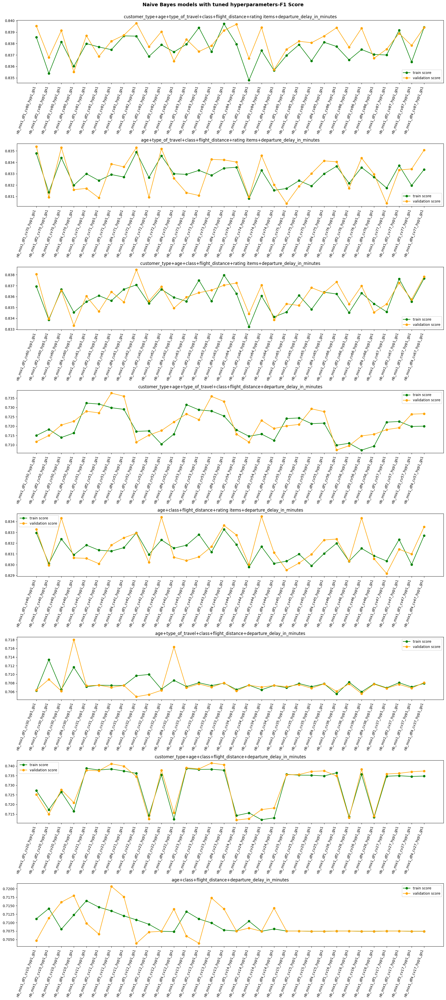

In [69]:
##############################################
#Show Trian and Validation Results
#F1 score
##############################################

fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']


for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_train_score['feature_index']=nb_train_score['model'].str.extract(r'_cv(\d+)_').astype(int)
    nb_val_score['feature_index']=nb_val_score['model'].str.extract(r'_cv(\d+)_').astype(int)
    mask_train=nb_train_score['feature_index'].isin(feature_index)
    mask_val=nb_val_score['feature_index'].isin(feature_index)
    #plot train scores
    ax.plot(nb_train_score[mask_train]['model'], nb_train_score[mask_train]['F1'], color='green', label='train score',marker='o')
    #plot validation scores
    ax.plot(nb_val_score[mask_val]['model'], nb_val_score[mask_val]['F1'], color='orange', label='validation score',marker='o')
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models with tuned hyperparameters-F1 Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()

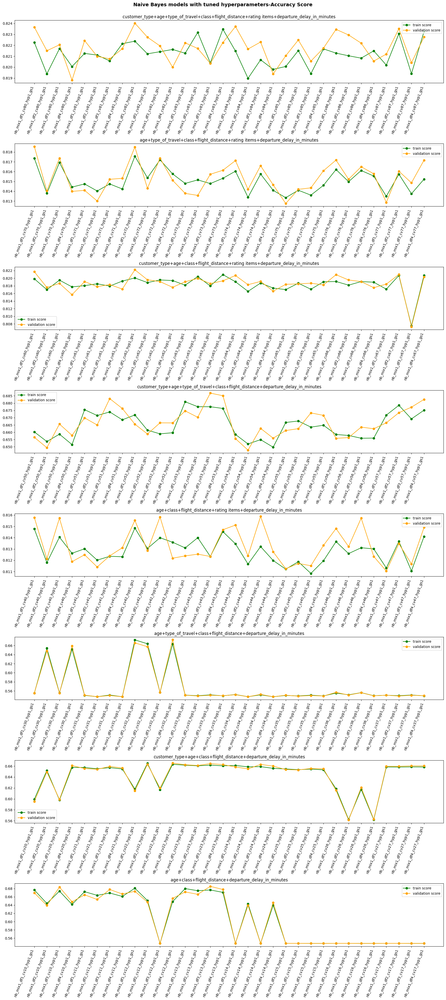

In [70]:
##############################################
#Show Trian and Validation Results
#accuracy score
##############################################

fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']


for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_train_score['feature_index']=nb_train_score['model'].str.extract(r'_cv(\d+)_').astype(int)
    nb_val_score['feature_index']=nb_val_score['model'].str.extract(r'_cv(\d+)_').astype(int)
    mask_train=nb_train_score['feature_index'].isin(feature_index)
    mask_val=nb_val_score['feature_index'].isin(feature_index)
    #plot train scores
    ax.plot(nb_train_score[mask_train]['model'], nb_train_score[mask_train]['accuracy'], color='green', label='train score',marker='o')
    #plot validation scores
    ax.plot(nb_val_score[mask_val]['model'], nb_val_score[mask_val]['accuracy'], color='orange', label='validation score',marker='o')
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models with tuned hyperparameters-Accuracy Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()

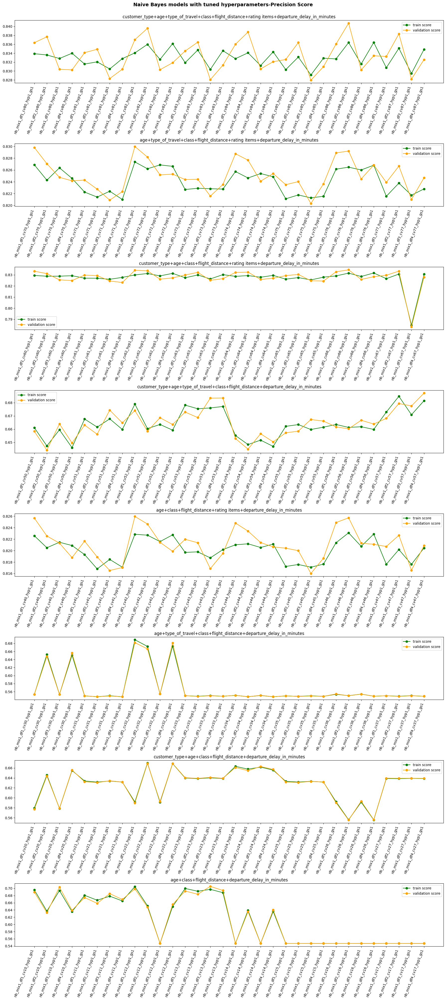

In [71]:
##############################################
#Show Trian and Validation Results
#Precision score
##############################################

fig, axs = plt.subplots(8, 1, figsize=(18,40))

metrics=['precision','recall', 'F1','accuracy','ROC_AUC']


for features,feature_index, ax in zip(feature_index_map.keys(),feature_index_map.values(), axs.ravel()):
    nb_train_score['feature_index']=nb_train_score['model'].str.extract(r'_cv(\d+)_').astype(int)
    nb_val_score['feature_index']=nb_val_score['model'].str.extract(r'_cv(\d+)_').astype(int)
    mask_train=nb_train_score['feature_index'].isin(feature_index)
    mask_val=nb_val_score['feature_index'].isin(feature_index)
    #plot train scores
    ax.plot(nb_train_score[mask_train]['model'], nb_train_score[mask_train]['precision'], color='green', label='train score',marker='o')
    #plot validation scores
    ax.plot(nb_val_score[mask_val]['model'], nb_val_score[mask_val]['precision'], color='orange', label='validation score',marker='o')
    ax.set_title(features)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=70, ha='right')
    ax.legend()

plt.suptitle('Naive Bayes models with tuned hyperparameters-Precision Score',y=1,fontsize=14,fontweight='bold')
plt.tight_layout()
plt.show()